# Section 2 - Statistics : EU Construction Industry

## Section 2.1 Importing Libraries and Data

In [1]:
#Loading in the libraries required.
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from scipy import stats
from scipy.stats import shapiro, anderson
from scipy.stats import boxcox
import statsmodels.api as sm
import pylab as py
from scipy.stats import yeojohnson
from scipy.stats import mannwhitneyu
from scipy.stats import levene
from scipy.stats import f_oneway


In [2]:
#importing data
data_stats = pd.read_csv('merged_data_2020_ire.csv')

In [3]:
#viewing information on the data
data_stats.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3171 entries, 0 to 3170
Data columns (total 42 columns):
 #   Column                                                          Non-Null Count  Dtype  
---  ------                                                          --------------  -----  
 0   Country                                                         3171 non-null   object 
 1   Year-Quarter                                                    3171 non-null   object 
 2   Production Volume Index                                         3171 non-null   float64
 3   Production Volume Flag                                          198 non-null    object 
 4   Output Price Index in Construction                              2987 non-null   float64
 5   Output Price Flag in Construction                               1715 non-null   object 
 6   Employment Index                                                3083 non-null   float64
 7   Hours Worked Index                                 

In [4]:
#viewing first 5 lines of data
data_stats.head()

,Country,Year-Quarter,Production Volume Index,Production Volume Flag,Output Price Index in Construction,Output Price Flag in Construction,Employment Index,Hours Worked Index,Gross Wage and Salary Index,Employment Flag,...,Useful Floor Area m^2 Flag Residental for Communities,Useful Floor Area m^2 Flag Residential,Useful Floor Area m^2 Flag Residential except for Communities,Useful Floor Area m^2 Flag Two-Plus Dwellings,House Price Index,House Price Flag,GDP,GDP Flag,Year,Missing
0,AL,2005-Q1,33.1,NaN,92.8,s,67.8,NaN,31.6,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2005,False
1,AL,2005-Q2,51.7,NaN,92.5,s,68.4,NaN,33.5,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2005,False
2,AL,2005-Q3,48.4,NaN,92.3,s,65.1,NaN,32.4,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2005,False
3,AL,2005-Q4,65.9,NaN,92.5,s,64.2,NaN,32.3,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2005,False
4,AL,2006-Q1,36.6,NaN,92.5,s,67.3,NaN,33.3,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2006,False


In [5]:
#creating new column quarter from the variable year-quarter by taking teh last two letters in the string
data_stats['Quarter'] = data_stats['Year-Quarter'].str[-2:]

In [6]:
#checking to make sure the quarter variable was created properly and no unexpected values
data_stats['Quarter'].unique()

array(['Q1', 'Q2', 'Q3', 'Q4'], dtype=object)

In [7]:
#looking at the unique values for the country codes
data_stats['Country'].unique()

array(['AL', 'AT', 'BA', 'BE', 'BG', 'CH', 'CY', 'CZ', 'DE', 'DK', 'EE',
       'EL', 'ES', 'FI', 'FR', 'HR', 'HU', 'IE', 'IT', 'LT', 'LU', 'LV',
       'ME', 'MK', 'MT', 'NL', 'NO', 'PL', 'PT', 'RO', 'RS', 'SE', 'SI',
       'SK', 'TR', 'UK'], dtype=object)

## Section 2.2 Defining Functions

In [8]:
#creating a function to display histograms for all variables in a dataframe
def df_histograms(df):
    for column in df.columns:
        plt.figure()
        plt.hist(df[column], bins=10)
        plt.title(column)
        plt.xlabel(column)
        plt.ylabel("Frequency")
        plt.show()

In [9]:
def df_boxplots(df, Country):
    cols = df.columns[1:]
    for col in cols:
        fig = px.box(df, x=Country, y=col)
        fig.update_layout(title=f'Boxplot for {col}', xaxis_title=Country, yaxis_title=f'{col}')
        fig.show()

In [10]:
def df_qqplot(df):
    for column in df.columns:
        plt.figure()
        sm.qqplot(df, line ='45')
        plt.title(f'Q-Q PLot for {column}')
        plt.xlabel("Theoretical Quantiles")
        plt.ylabel("Sample Quantiles")
        plt.show()

## Section 2.3 Descriptive Statistics

In [11]:
#viewing stats of dataframe
data_stats.describe()

,Production Volume Index,Output Price Index in Construction,Employment Index,Hours Worked Index,Gross Wage and Salary Index,Number of Dwellings Index One-Dwelling,Number of Dwellings Index Residential except for Communities,Number of Dwellings Index Two-Plus Dwellings,Useful Floor Area m^2 Index Buildings,Useful Floor Area m^2 Index Non-Residential,Useful Floor Area m^2 Index Non-Residential except Offices,Useful Floor Area m^2 Index Office Buildings,Useful Floor Area m^2 Index One-Dwelling,Useful Floor Area m^2 Index Residental for Communities,Useful Floor Area m^2 Index Residential,Useful Floor Area m^2 Index Residential except for Communities,Useful Floor Area m^2 Index Two-Plus Dwellings,House Price Index,GDP,Year
count,3171.000000,2987.000000,3083.000000,2968.000000,2976.000000,3005.000000,3005.000000,3005.000000,2799.000000,2944.000000,2981.000000,2857.000000,2981.000000,2631.000000,2767.000000,2799.000000,2981.000000,1884.000000,2844.000000,3171.000000
mean,113.130716,96.215099,110.040512,108.881334,101.584543,167.641897,202.117537,257.221032,135.068310,153.975068,129.058269,239.346097,165.409292,189.521095,186.095193,201.408574,258.986213,109.935218,6830.077356,2011.306213
std,61.197449,20.046500,28.026964,30.180491,41.456341,201.490344,311.173379,464.096845,89.489342,153.055449,87.652302,488.775575,213.545517,386.436754,264.507460,330.008274,491.576133,26.518610,5074.378836,6.584794
min,5.300000,16.800000,43.800000,9.300000,5.200000,5.600000,11.500000,3.300000,12.000000,10.400000,4.100000,0.000000,8.800000,0.000000,16.800000,2.500000,1.300000,49.470000,350.000000,2000.000000
25%,84.500000,85.400000,96.150000,94.100000,78.400000,93.700000,85.900000,74.800000,87.100000,89.175000,83.400000,67.300000,91.700000,39.850000,90.550000,91.350000,77.900000,94.297500,3027.500000,2006.000000
50%,102.600000,98.400000,104.400000,103.250000,99.400000,118.200000,115.700000,114.300000,113.500000,114.300000,109.900000,121.500000,117.000000,87.900000,116.900000,118.100000,115.400000,104.550000,5780.000000,2011.000000
75%,122.500000,104.300000,118.200000,115.325000,120.000000,164.300000,177.300000,211.300000,151.200000,158.100000,144.700000,226.600000,161.300000,184.400000,176.550000,179.100000,211.100000,122.012500,9302.500000,2017.000000
max,791.000000,226.300000,264.800000,288.100000,381.300000,3733.300000,6217.300000,9312.000000,902.500000,2344.000000,901.200000,8134.000000,3784.700000,8210.700000,5700.900000,5751.700000,9629.800000,261.440000,31490.000000,2023.000000


### Section 2.2.1 Distribution of Data

#### Section 2.2.1.1 Histograms

In [12]:
#subsetting out irish data
data_ireland = data_stats[data_stats['Country']=='IE']
#subsetting for specific columns
data_ireland=data_ireland.iloc[:, [0,2,40,42,38]]
#checking execution
data_ireland.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 92 entries, 1484 to 1575
Data columns (total 5 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Country                  92 non-null     object 
 1   Production Volume Index  92 non-null     float64
 2   Year                     92 non-null     int64  
 3   Quarter                  92 non-null     object 
 4   GDP                      92 non-null     float64
dtypes: float64(2), int64(1), object(2)
memory usage: 4.3+ KB


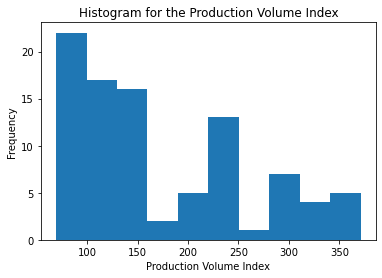

In [13]:
#looking at the distribution of the production volume index data for Ireland
plt.hist(data_ireland['Production Volume Index'], bins=10)

plt.xlabel('Production Volume Index')
plt.ylabel('Frequency')
plt.title('Histogram for the Production Volume Index')

plt.show()

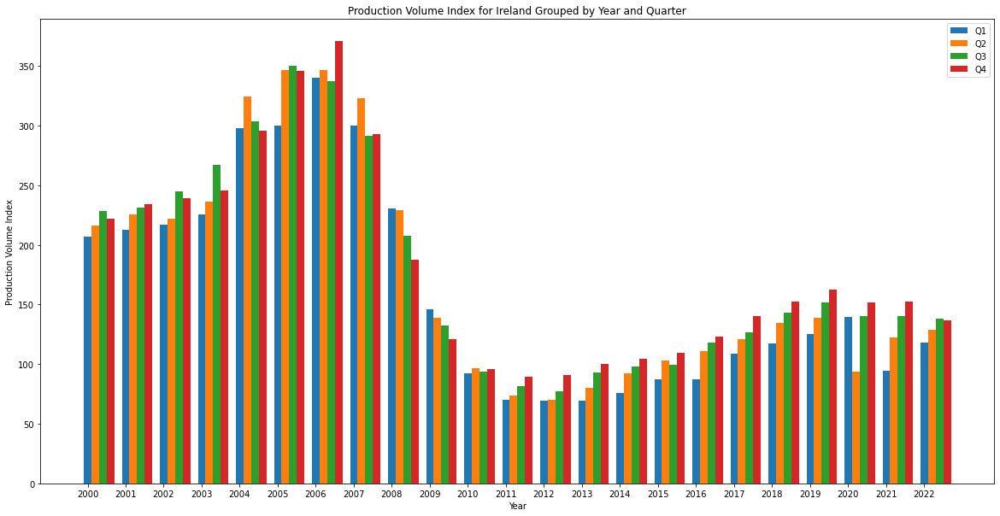

In [14]:
#looking at the production volume index data for Ireland
ie_grouped=data_ireland.groupby(['Year', 'Quarter'])['Production Volume Index'].sum().reset_index()
years=len(ie_grouped['Year'].unique())

width=0.2

fig, ax =plt.subplots(figsize=(20, 10))
for i, quarter in enumerate(['Q1', 'Q2', 'Q3', 'Q4']):
    x = ie_grouped[ie_grouped['Quarter']==quarter]['Year']
    y = ie_grouped[ie_grouped['Quarter']==quarter]['Production Volume Index']
    ax.bar(x + i * width, y, width=width, label=quarter)
    
ax.set_xlabel('Year')
ax.set_ylabel('Production Volume Index')
ax.set_title('Production Volume Index for Ireland Grouped by Year and Quarter')
ax.set_xticks(ie_grouped['Year'].unique())
ax.legend()

plt.show()

In [15]:
#viewing data
data_ireland.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 92 entries, 1484 to 1575
Data columns (total 5 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Country                  92 non-null     object 
 1   Production Volume Index  92 non-null     float64
 2   Year                     92 non-null     int64  
 3   Quarter                  92 non-null     object 
 4   GDP                      92 non-null     float64
dtypes: float64(2), int64(1), object(2)
memory usage: 4.3+ KB


C:\Users\Owner\AppData\Local\Temp\ipykernel_27092\2702742739.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  ie_grouped_GDP=data_ireland.groupby(['Year', 'Quarter'])['Production Volume Index','GDP'].sum().reset_index()


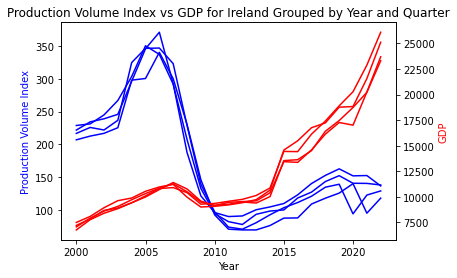

In [16]:
#looking at the production volume index data for Ireland
ie_grouped_GDP=data_ireland.groupby(['Year', 'Quarter'])['Production Volume Index','GDP'].sum().reset_index()
years_GDP=len(ie_grouped['Year'].unique())

#plot graph
fig, ax1 = plt.subplots()
#creates a second y axis
ax2 = ax1.twinx()

#iterate across the quarters to generate x and y data for production volume, GDP per year
for i, quarter in enumerate(['Q1', 'Q2', 'Q3', 'Q4']):
    x = ie_grouped_GDP[ie_grouped_GDP['Quarter']==quarter]['Year']
    y = ie_grouped_GDP[ie_grouped_GDP['Quarter']==quarter]['Production Volume Index']
    y2 = ie_grouped_GDP[ie_grouped_GDP['Quarter']==quarter]['GDP']
    
    ax1.plot(x, y, color='blue')
    ax2.plot(x, y2, color='red')

#labelling the axis
ax1.set_xlabel('Year')
ax1.set_ylabel('Production Volume Index',color='blue')
ax2.set_ylabel('GDP',color='red')

#setting the title
ax1.set_title('Production Volume Index vs GDP for Ireland Grouped by Year and Quarter')

# Display the plot
plt.show()

In [17]:
#creating a data set specifically with Ireland data and Index Columns
data_ie_hist=data_stats[data_stats['Country']=='IE']
data_ie_hist=data_ie_hist.iloc[:, [2,4,6,7,12,13,14,15,16,17,18,19,20,21,22,23,36,38]]

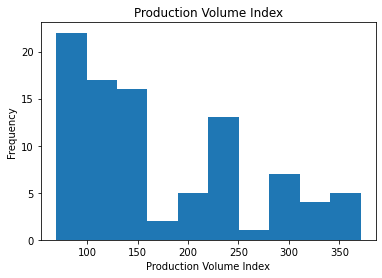

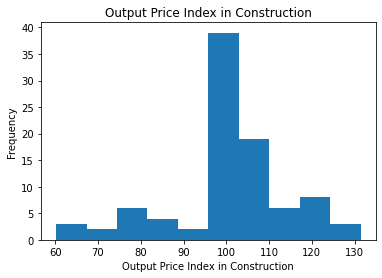

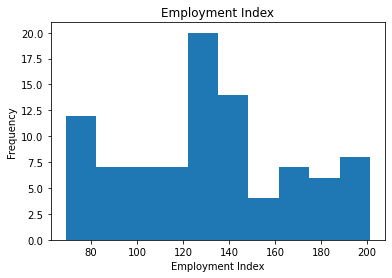

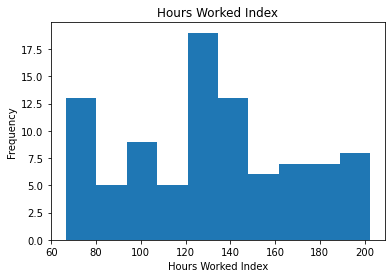

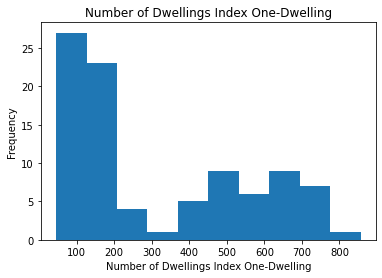

...

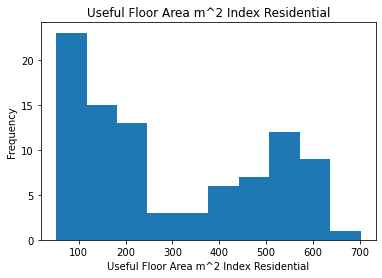

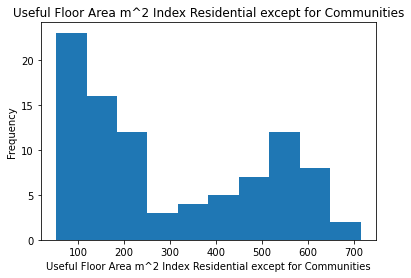

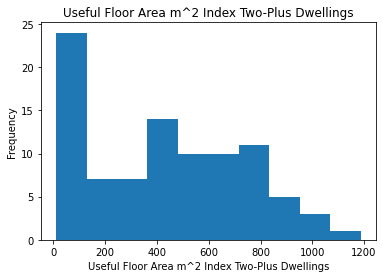

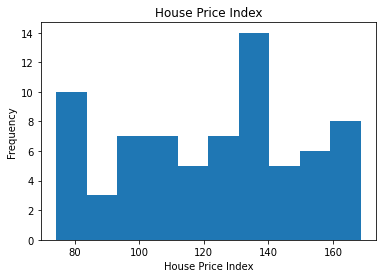

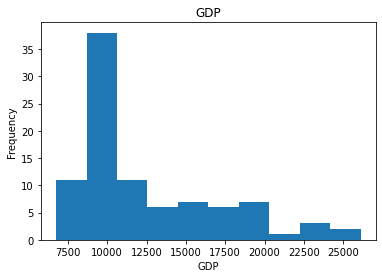

In [18]:
#generating histograms to look at the distribution of all the data for Ireland
df_histograms(data_ie_hist)

In [19]:
#creating a subset of the main data to create histograms
data_all_hist=data_stats.iloc[:, [2,4,6,7,12,13,14,15,16,17,18,19,20,21,22,23,36,38]]

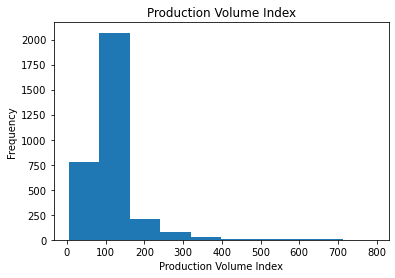

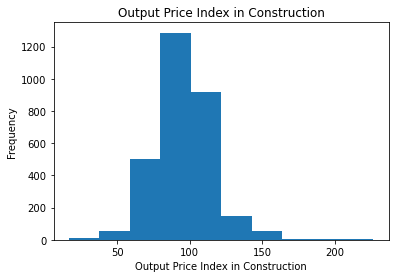

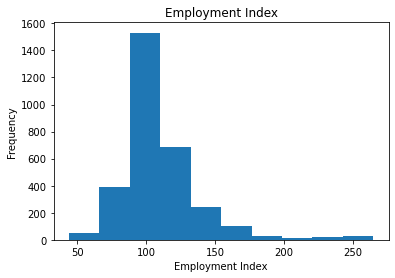

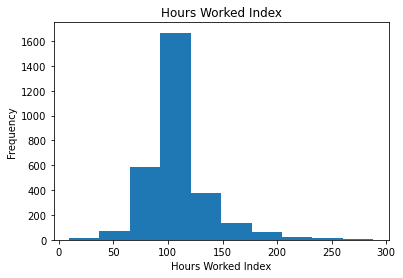

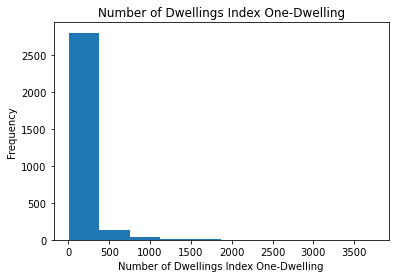

...

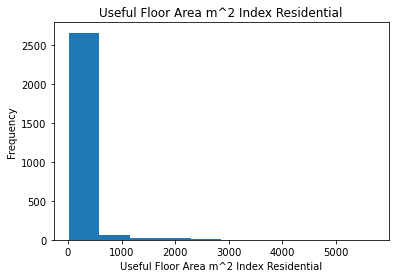

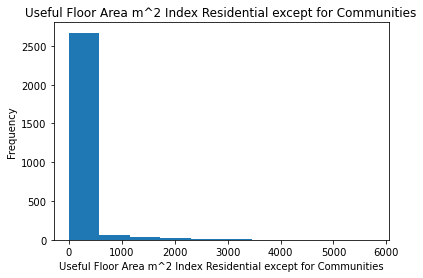

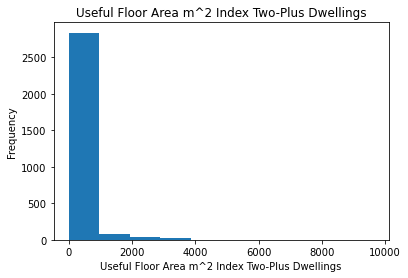

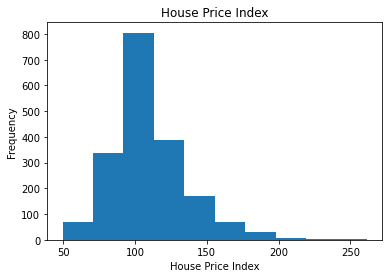

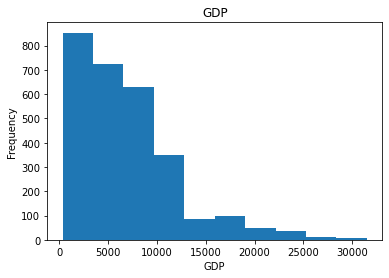

In [20]:
#generating histograms to look at the distribution of all the data
df_histograms(data_all_hist)

<Figure size 432x288 with 0 Axes>

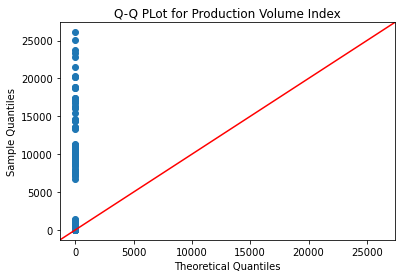

<Figure size 432x288 with 0 Axes>

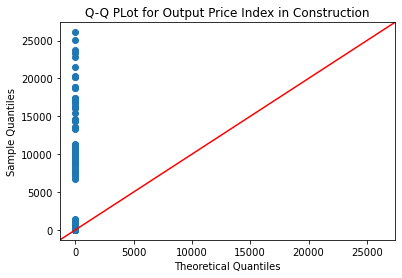

<Figure size 432x288 with 0 Axes>

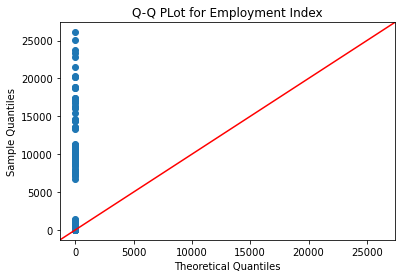

<Figure size 432x288 with 0 Axes>

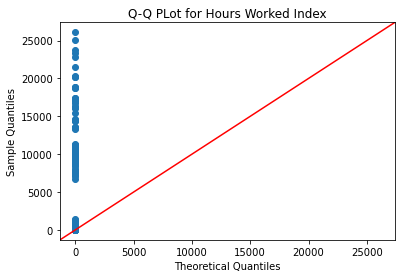

<Figure size 432x288 with 0 Axes>

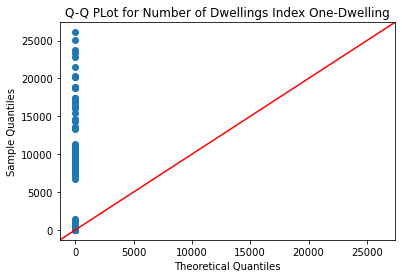

<Figure size 432x288 with 0 Axes>

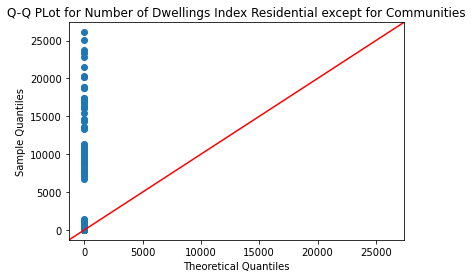

<Figure size 432x288 with 0 Axes>

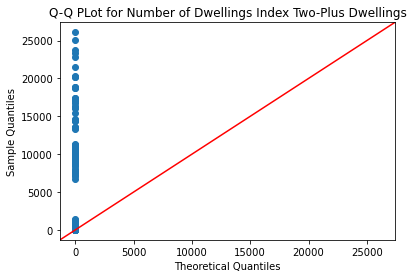

<Figure size 432x288 with 0 Axes>

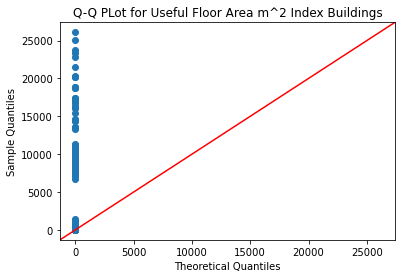

<Figure size 432x288 with 0 Axes>

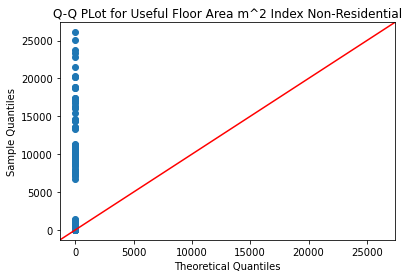

<Figure size 432x288 with 0 Axes>

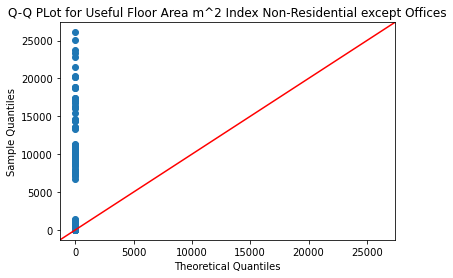

<Figure size 432x288 with 0 Axes>

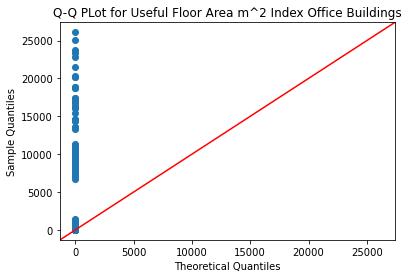

<Figure size 432x288 with 0 Axes>

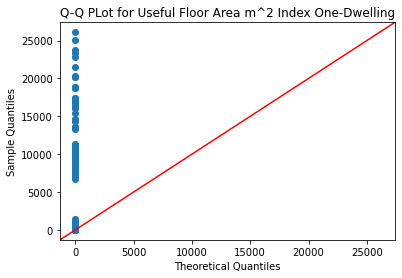

<Figure size 432x288 with 0 Axes>

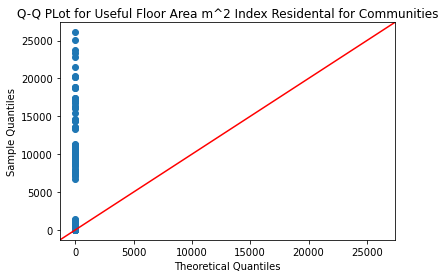

<Figure size 432x288 with 0 Axes>

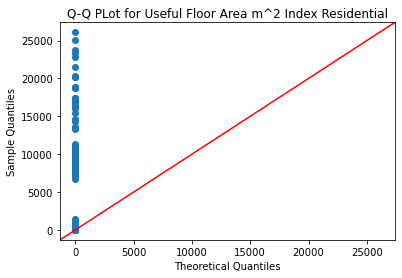

<Figure size 432x288 with 0 Axes>

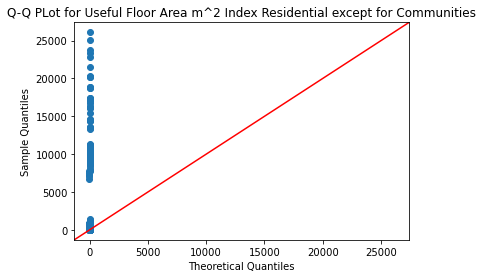

<Figure size 432x288 with 0 Axes>

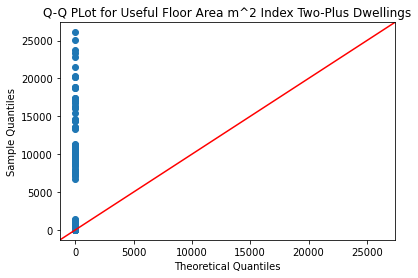

<Figure size 432x288 with 0 Axes>

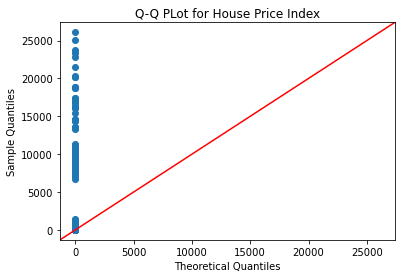

<Figure size 432x288 with 0 Axes>

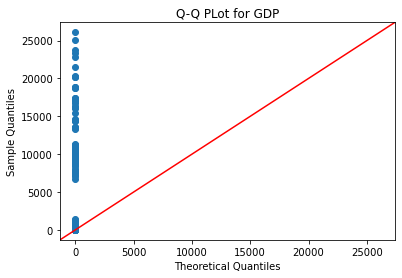

In [21]:
#creating quantile quantile plots for each column for irish data
df_qqplot(data_ie_hist)

<Figure size 432x288 with 0 Axes>

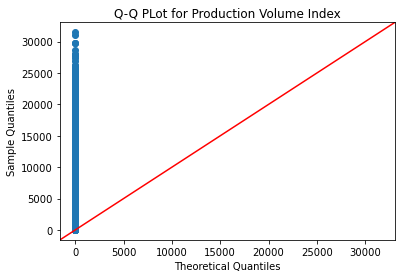

<Figure size 432x288 with 0 Axes>

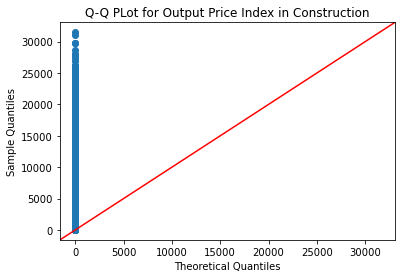

<Figure size 432x288 with 0 Axes>

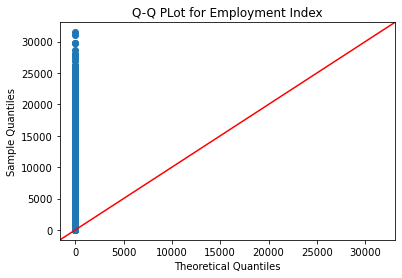

<Figure size 432x288 with 0 Axes>

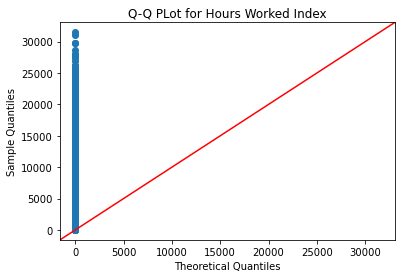

<Figure size 432x288 with 0 Axes>

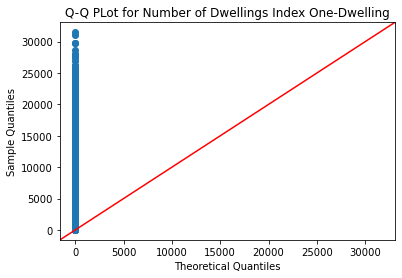

<Figure size 432x288 with 0 Axes>

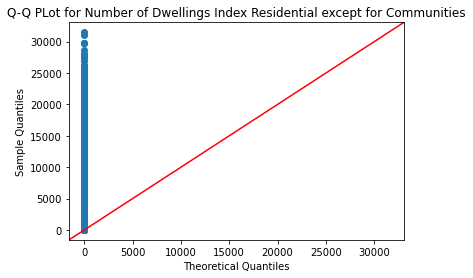

<Figure size 432x288 with 0 Axes>

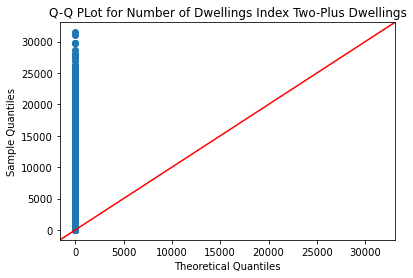

<Figure size 432x288 with 0 Axes>

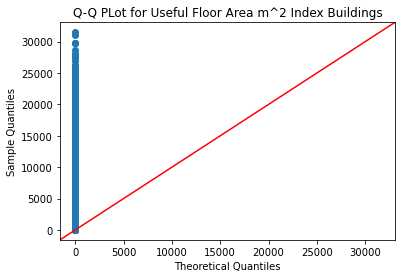

<Figure size 432x288 with 0 Axes>

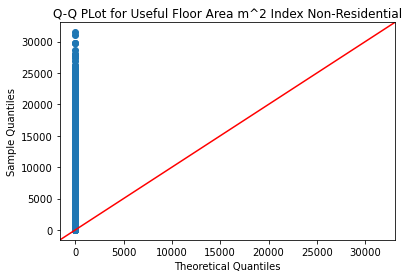

<Figure size 432x288 with 0 Axes>

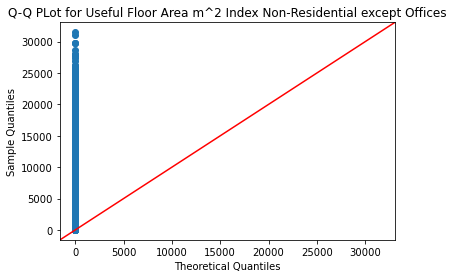

<Figure size 432x288 with 0 Axes>

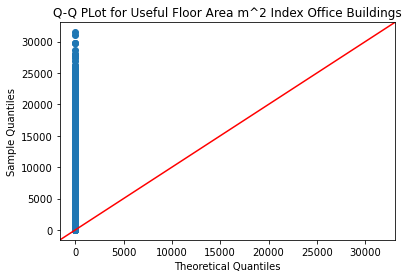

<Figure size 432x288 with 0 Axes>

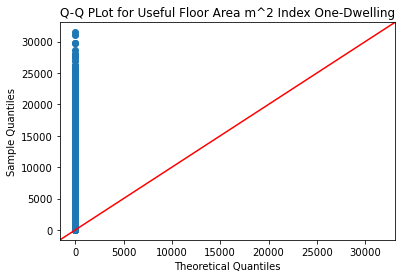

<Figure size 432x288 with 0 Axes>

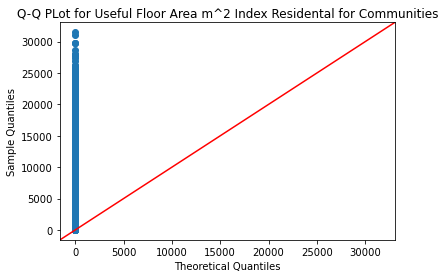

<Figure size 432x288 with 0 Axes>

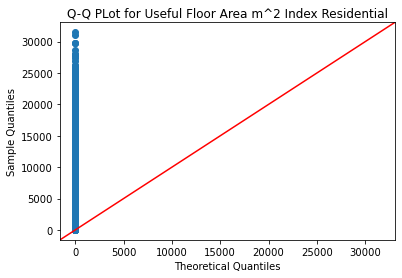

<Figure size 432x288 with 0 Axes>

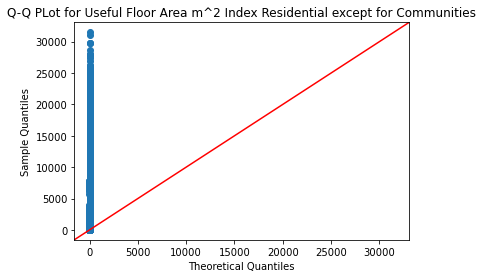

<Figure size 432x288 with 0 Axes>

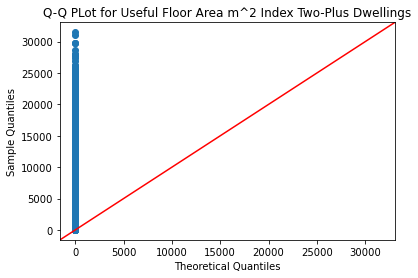

<Figure size 432x288 with 0 Axes>

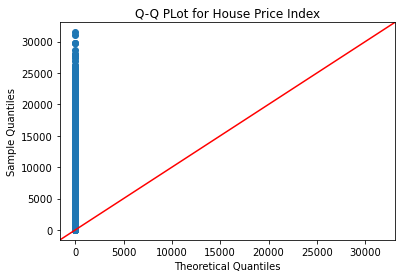

<Figure size 432x288 with 0 Axes>

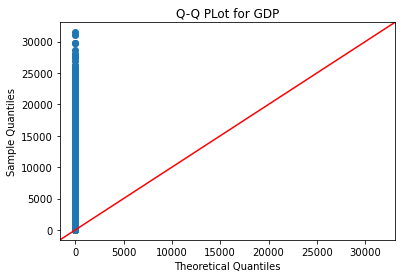

In [22]:
#creating quantile quantile plots for all the data
df_qqplot(data_all_hist)

#### Section 2.2.1.1 Normality

The histograms created for the variables above show distributions that seem to be non-normal. Next we will look at doing the Shapiro Wilks Test and Andersons Darling Tests to support that evidence

In [23]:
#viewing data
data_stats.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3171 entries, 0 to 3170
Data columns (total 43 columns):
 #   Column                                                          Non-Null Count  Dtype  
---  ------                                                          --------------  -----  
 0   Country                                                         3171 non-null   object 
 1   Year-Quarter                                                    3171 non-null   object 
 2   Production Volume Index                                         3171 non-null   float64
 3   Production Volume Flag                                          198 non-null    object 
 4   Output Price Index in Construction                              2987 non-null   float64
 5   Output Price Flag in Construction                               1715 non-null   object 
 6   Employment Index                                                3083 non-null   float64
 7   Hours Worked Index                                 

In [24]:
#intializing lists
columns_norm=[]
shapiro_norm=[]
anderson_norm=[]
summary_sw=[]
summary_ad=[]

#getting a list of all the numeric columns in dataframe, as it will throw an error if ran over objects
numeric_cols = data_stats.select_dtypes(include=['int', 'float']).columns.tolist()

for column in numeric_cols:
    #dropping any rows that have missing data as it throws an error
    drop_nan = data_stats[column].dropna().to_frame()
    #calculating shapiro
    shapiro_stat, shapiro_p = shapiro(drop_nan[column])
    #calculating anderson
    anderson_stat, anderson_critical, anderson_significance = anderson(drop_nan[column])
    #appending the balues into lists
    columns_norm.append(column)
    shapiro_norm.append(shapiro_p)
    anderson_norm.append(anderson_stat)
    
    #creating a summary outcome for anderson darling test
    if anderson_stat < anderson_critical[2]:
        outcome = 'Normal'
    else:
        outcome = 'Not Normal'
    summary_ad.append(outcome)
    #creating a summart outcome for shapiro wilks
    if shapiro_p < 0.05:
        outcome1 = 'Not Normal'
    else:
        outcome1 = 'Normal'
    summary_sw.append(outcome1)

#creating a dataframe with all values and summaries
norm_summary=pd.DataFrame({
    'Column' : columns_norm,
    'Shapiro-Wilk p-value' : shapiro_norm,
    'Shapiro-Wilk Outcomes' : summary_sw,
    'Anderson-Darling Critical' : anderson_critical[2],
    'Anderson-Darling Stat' : anderson_stat,
    'Anderson-Darling Outcome' : summary_ad
})

norm_summary

,Column,Shapiro-Wilk p-value,Shapiro-Wilk Outcomes,Anderson-Darling Critical,Anderson-Darling Stat,Anderson-Darling Outcome
0,Production Volume Index,0.000000e+00,Not Normal,0.786,34.433261,Not Normal
1,Output Price Index in Construction,5.385317e-33,Not Normal,0.786,34.433261,Not Normal
2,Employment Index,0.000000e+00,Not Normal,0.786,34.433261,Not Normal
3,Hours Worked Index,0.000000e+00,Not Normal,0.786,34.433261,Not Normal
4,Gross Wage and Salary Index,5.421690e-34,Not Normal,0.786,34.433261,Not Normal
5,Number of Dwellings Index One-Dwelling,0.000000e+00,Not Normal,0.786,34.433261,Not Normal
6,Number of Dwellings Index Residential except f...,0.000000e+00,Not Normal,0.786,34.433261,Not Normal
7,Number of Dwellings Index Two-Plus Dwellings,0.000000e+00,Not Normal,0.786,34.433261,Not Normal
8,Useful Floor Area m^2 Index Buildings,0.000000e+00,Not Normal,0.786,34.433261,Not Normal
9,Useful Floor Area m^2 Index Non-Residential,0.000000e+00,Not Normal,0.786,34.433261,Not Normal


In [25]:
#looking at min to see where negaive values are due to error in boxcox
data_stats.describe()

,Production Volume Index,Output Price Index in Construction,Employment Index,Hours Worked Index,Gross Wage and Salary Index,Number of Dwellings Index One-Dwelling,Number of Dwellings Index Residential except for Communities,Number of Dwellings Index Two-Plus Dwellings,Useful Floor Area m^2 Index Buildings,Useful Floor Area m^2 Index Non-Residential,Useful Floor Area m^2 Index Non-Residential except Offices,Useful Floor Area m^2 Index Office Buildings,Useful Floor Area m^2 Index One-Dwelling,Useful Floor Area m^2 Index Residental for Communities,Useful Floor Area m^2 Index Residential,Useful Floor Area m^2 Index Residential except for Communities,Useful Floor Area m^2 Index Two-Plus Dwellings,House Price Index,GDP,Year
count,3171.000000,2987.000000,3083.000000,2968.000000,2976.000000,3005.000000,3005.000000,3005.000000,2799.000000,2944.000000,2981.000000,2857.000000,2981.000000,2631.000000,2767.000000,2799.000000,2981.000000,1884.000000,2844.000000,3171.000000
mean,113.130716,96.215099,110.040512,108.881334,101.584543,167.641897,202.117537,257.221032,135.068310,153.975068,129.058269,239.346097,165.409292,189.521095,186.095193,201.408574,258.986213,109.935218,6830.077356,2011.306213
std,61.197449,20.046500,28.026964,30.180491,41.456341,201.490344,311.173379,464.096845,89.489342,153.055449,87.652302,488.775575,213.545517,386.436754,264.507460,330.008274,491.576133,26.518610,5074.378836,6.584794
min,5.300000,16.800000,43.800000,9.300000,5.200000,5.600000,11.500000,3.300000,12.000000,10.400000,4.100000,0.000000,8.800000,0.000000,16.800000,2.500000,1.300000,49.470000,350.000000,2000.000000
25%,84.500000,85.400000,96.150000,94.100000,78.400000,93.700000,85.900000,74.800000,87.100000,89.175000,83.400000,67.300000,91.700000,39.850000,90.550000,91.350000,77.900000,94.297500,3027.500000,2006.000000
50%,102.600000,98.400000,104.400000,103.250000,99.400000,118.200000,115.700000,114.300000,113.500000,114.300000,109.900000,121.500000,117.000000,87.900000,116.900000,118.100000,115.400000,104.550000,5780.000000,2011.000000
75%,122.500000,104.300000,118.200000,115.325000,120.000000,164.300000,177.300000,211.300000,151.200000,158.100000,144.700000,226.600000,161.300000,184.400000,176.550000,179.100000,211.100000,122.012500,9302.500000,2017.000000
max,791.000000,226.300000,264.800000,288.100000,381.300000,3733.300000,6217.300000,9312.000000,902.500000,2344.000000,901.200000,8134.000000,3784.700000,8210.700000,5700.900000,5751.700000,9629.800000,261.440000,31490.000000,2023.000000


#### Section 2.2.1.1.1 BoxCox Transformation

In [26]:
#performing boxcox transformations for normality
data_boxcox=data_stats
#adding 1 to shift data where there is a zero value
data_boxcox[['Useful Floor Area m^2 Index Office Buildings','Useful Floor Area m^2 Index Residental for Communities']] += 1

In [27]:
#checking the shift was executed properly
data_boxcox.describe()

,Production Volume Index,Output Price Index in Construction,Employment Index,Hours Worked Index,Gross Wage and Salary Index,Number of Dwellings Index One-Dwelling,Number of Dwellings Index Residential except for Communities,Number of Dwellings Index Two-Plus Dwellings,Useful Floor Area m^2 Index Buildings,Useful Floor Area m^2 Index Non-Residential,Useful Floor Area m^2 Index Non-Residential except Offices,Useful Floor Area m^2 Index Office Buildings,Useful Floor Area m^2 Index One-Dwelling,Useful Floor Area m^2 Index Residental for Communities,Useful Floor Area m^2 Index Residential,Useful Floor Area m^2 Index Residential except for Communities,Useful Floor Area m^2 Index Two-Plus Dwellings,House Price Index,GDP,Year
count,3171.000000,2987.000000,3083.000000,2968.000000,2976.000000,3005.000000,3005.000000,3005.000000,2799.000000,2944.000000,2981.000000,2857.000000,2981.000000,2631.000000,2767.000000,2799.000000,2981.000000,1884.000000,2844.000000,3171.000000
mean,113.130716,96.215099,110.040512,108.881334,101.584543,167.641897,202.117537,257.221032,135.068310,153.975068,129.058269,240.346097,165.409292,190.521095,186.095193,201.408574,258.986213,109.935218,6830.077356,2011.306213
std,61.197449,20.046500,28.026964,30.180491,41.456341,201.490344,311.173379,464.096845,89.489342,153.055449,87.652302,488.775575,213.545517,386.436754,264.507460,330.008274,491.576133,26.518610,5074.378836,6.584794
min,5.300000,16.800000,43.800000,9.300000,5.200000,5.600000,11.500000,3.300000,12.000000,10.400000,4.100000,1.000000,8.800000,1.000000,16.800000,2.500000,1.300000,49.470000,350.000000,2000.000000
25%,84.500000,85.400000,96.150000,94.100000,78.400000,93.700000,85.900000,74.800000,87.100000,89.175000,83.400000,68.300000,91.700000,40.850000,90.550000,91.350000,77.900000,94.297500,3027.500000,2006.000000
50%,102.600000,98.400000,104.400000,103.250000,99.400000,118.200000,115.700000,114.300000,113.500000,114.300000,109.900000,122.500000,117.000000,88.900000,116.900000,118.100000,115.400000,104.550000,5780.000000,2011.000000
75%,122.500000,104.300000,118.200000,115.325000,120.000000,164.300000,177.300000,211.300000,151.200000,158.100000,144.700000,227.600000,161.300000,185.400000,176.550000,179.100000,211.100000,122.012500,9302.500000,2017.000000
max,791.000000,226.300000,264.800000,288.100000,381.300000,3733.300000,6217.300000,9312.000000,902.500000,2344.000000,901.200000,8135.000000,3784.700000,8211.700000,5700.900000,5751.700000,9629.800000,261.440000,31490.000000,2023.000000


In [28]:
data_boxcox_final=data_boxcox.copy()
#performing boxcox transformation on all data
for column in numeric_cols:
    drop_data = data_boxcox[column].dropna()
    missing_data = data_boxcox[column].loc[data_boxcox[column].isna()]
    
    data_boxcox_final.loc[drop_data.index, column], trans_lambda = boxcox(drop_data)
    data_boxcox_final.loc[missing_data.index, column]=np.nan

In [29]:
#subsetting data for histograms
data_all_hist_bc=data_boxcox_final.iloc[:, [2,4,6,7,12,13,14,15,16,17,18,19,20,21,22,23,36,38]]

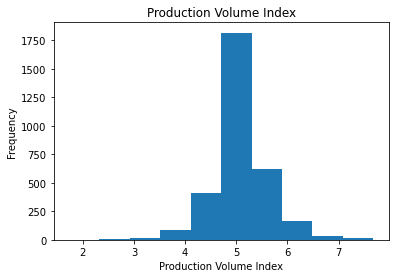

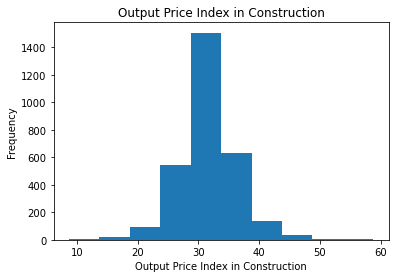

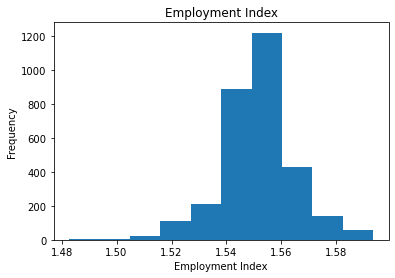

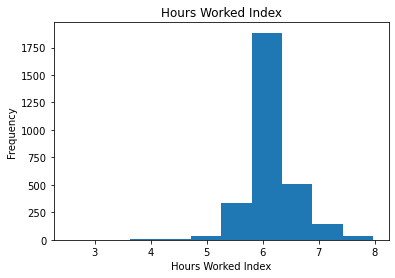

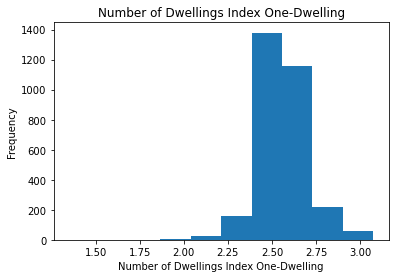

...

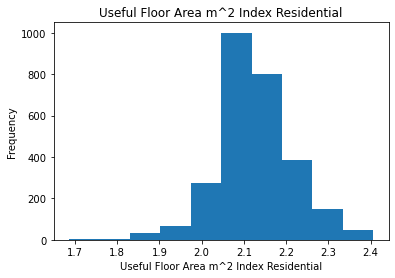

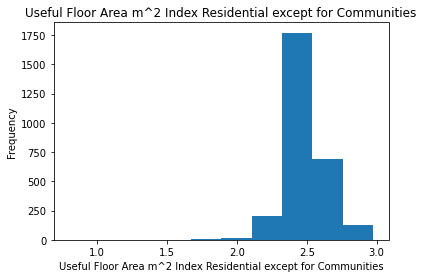

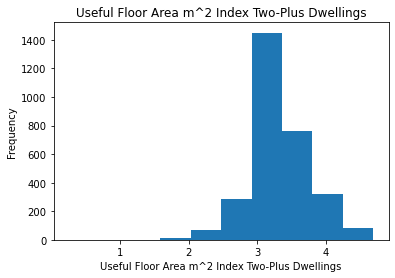

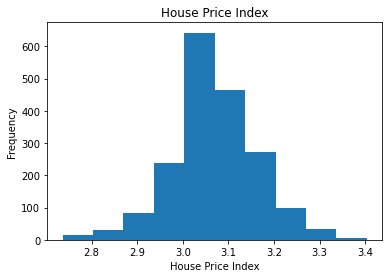

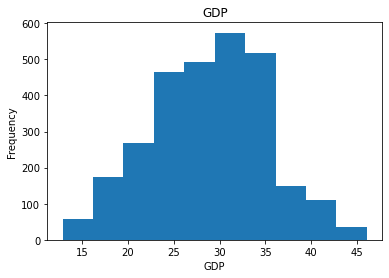

In [30]:
df_histograms(data_all_hist_bc)

In [31]:
#creating a data set specifically with Ireland data and Index Columns
data_ie_bc=data_boxcox_final[data_boxcox_final['Country']=='IE']
data_ie_bc=data_ie_bc.iloc[:, [2,4,6,7,12,13,14,15,16,17,18,19,20,21,22,23,36,38]]

<Figure size 432x288 with 0 Axes>

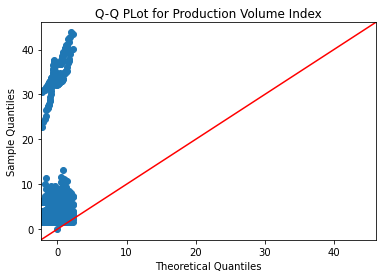

<Figure size 432x288 with 0 Axes>

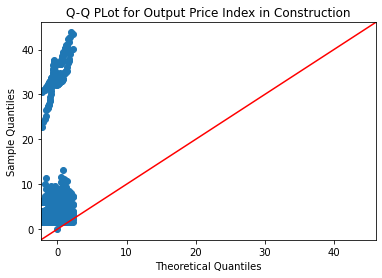

<Figure size 432x288 with 0 Axes>

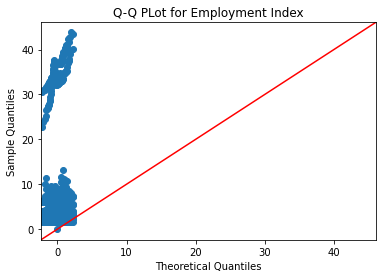

<Figure size 432x288 with 0 Axes>

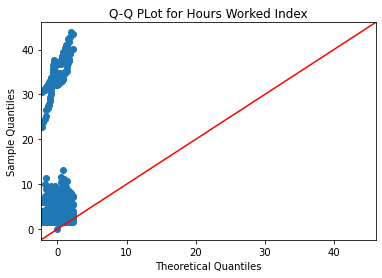

<Figure size 432x288 with 0 Axes>

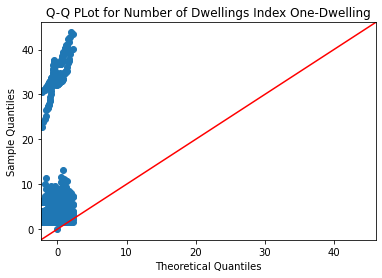

<Figure size 432x288 with 0 Axes>

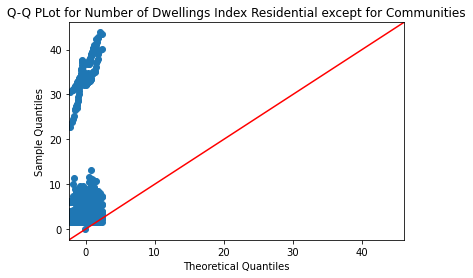

<Figure size 432x288 with 0 Axes>

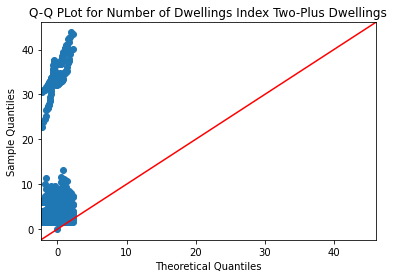

<Figure size 432x288 with 0 Axes>

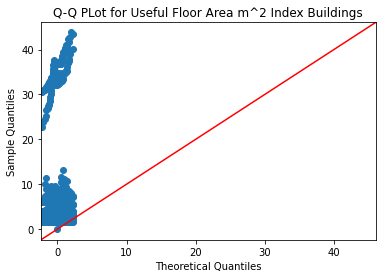

<Figure size 432x288 with 0 Axes>

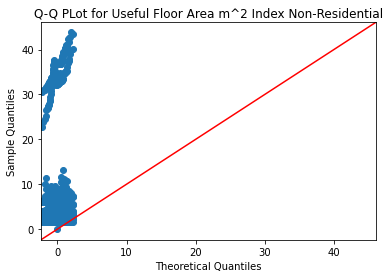

<Figure size 432x288 with 0 Axes>

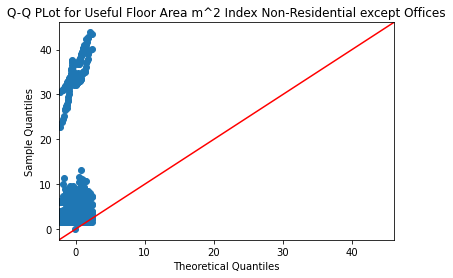

<Figure size 432x288 with 0 Axes>

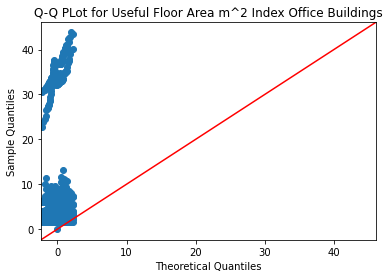

<Figure size 432x288 with 0 Axes>

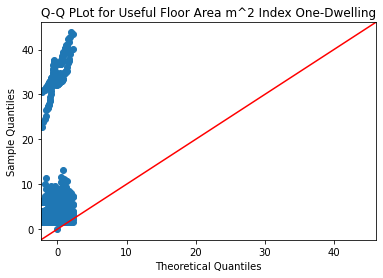

<Figure size 432x288 with 0 Axes>

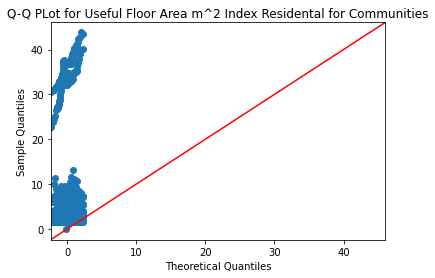

<Figure size 432x288 with 0 Axes>

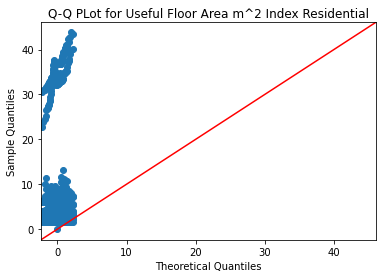

<Figure size 432x288 with 0 Axes>

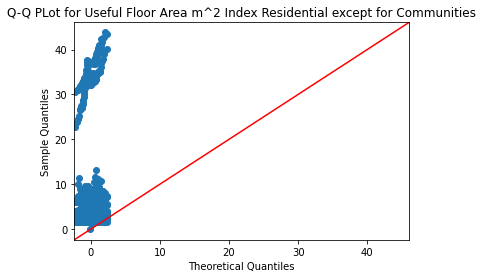

<Figure size 432x288 with 0 Axes>

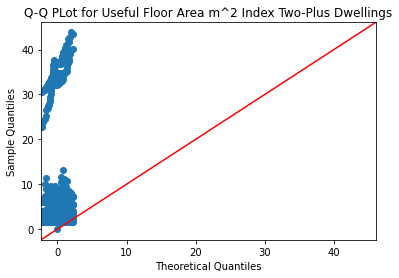

<Figure size 432x288 with 0 Axes>

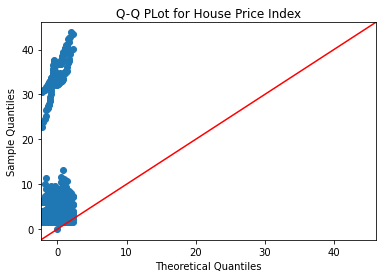

<Figure size 432x288 with 0 Axes>

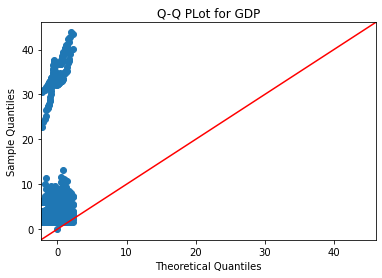

In [32]:
#creating quantile quantile plots for each column for irish data
df_qqplot(data_ie_bc)

<Figure size 432x288 with 0 Axes>

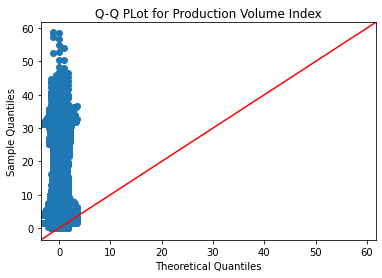

<Figure size 432x288 with 0 Axes>

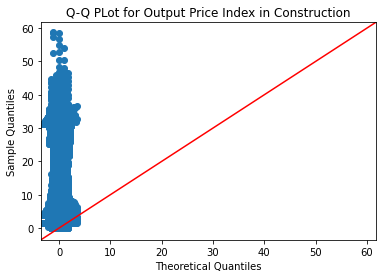

<Figure size 432x288 with 0 Axes>

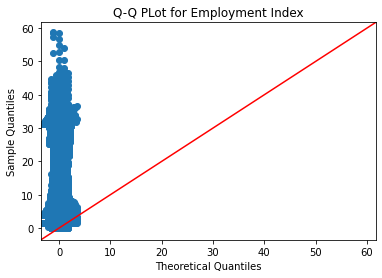

<Figure size 432x288 with 0 Axes>

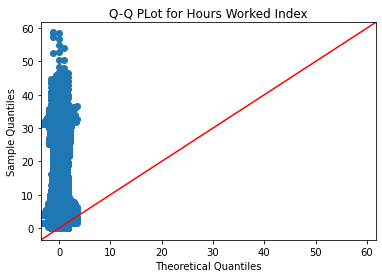

<Figure size 432x288 with 0 Axes>

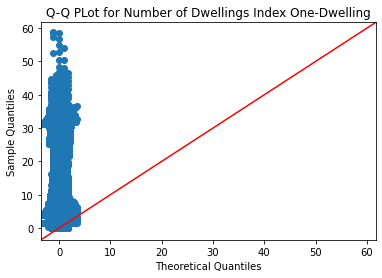

<Figure size 432x288 with 0 Axes>

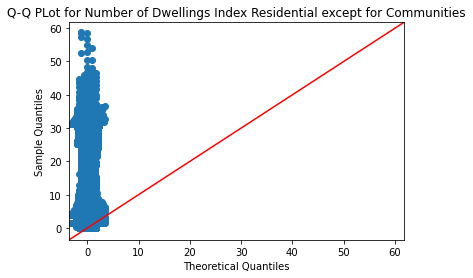

<Figure size 432x288 with 0 Axes>

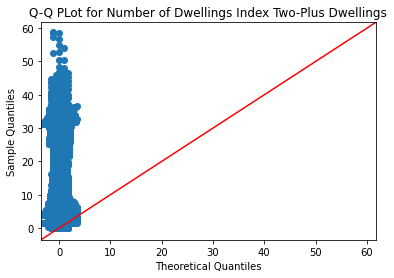

<Figure size 432x288 with 0 Axes>

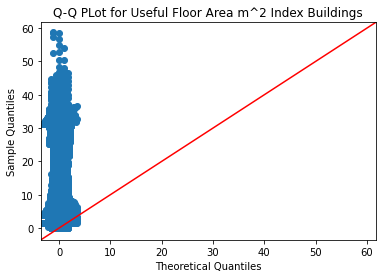

<Figure size 432x288 with 0 Axes>

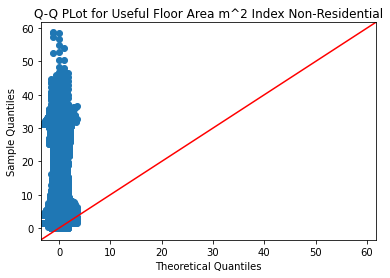

<Figure size 432x288 with 0 Axes>

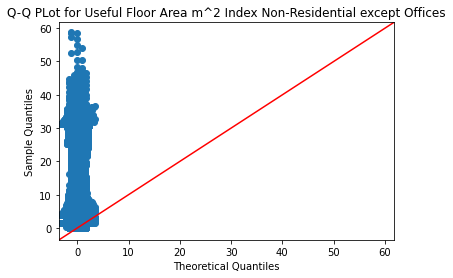

<Figure size 432x288 with 0 Axes>

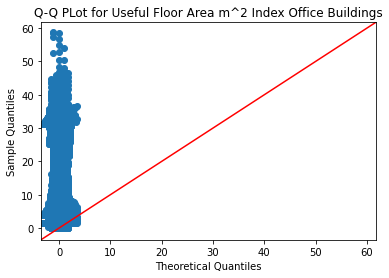

<Figure size 432x288 with 0 Axes>

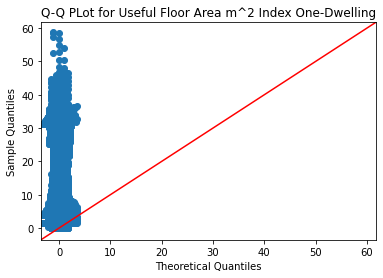

<Figure size 432x288 with 0 Axes>

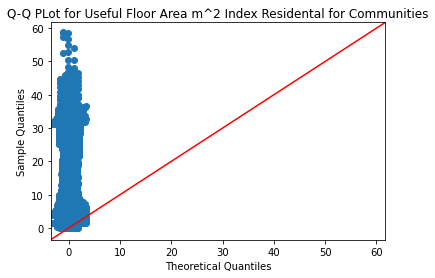

<Figure size 432x288 with 0 Axes>

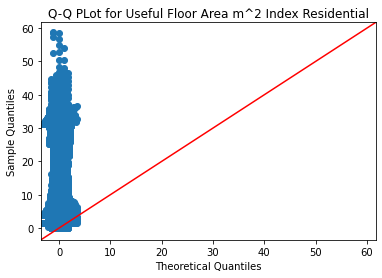

<Figure size 432x288 with 0 Axes>

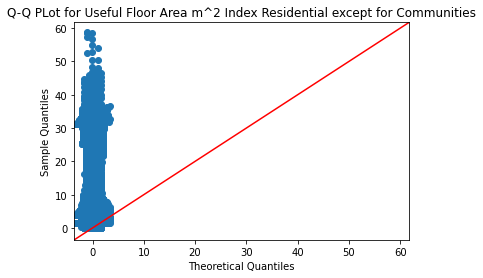

<Figure size 432x288 with 0 Axes>

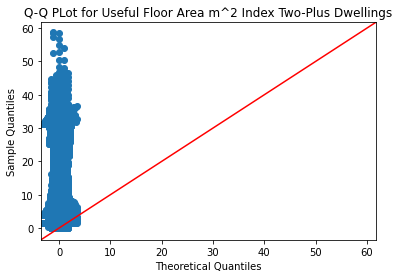

<Figure size 432x288 with 0 Axes>

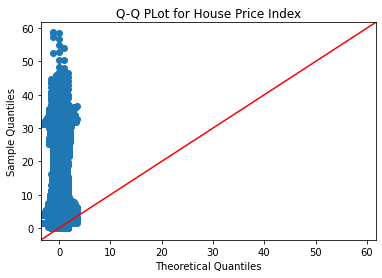

<Figure size 432x288 with 0 Axes>

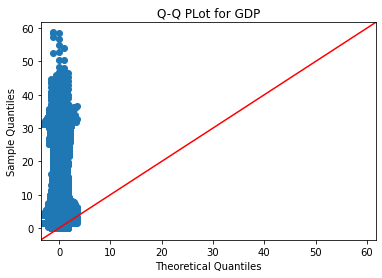

In [33]:
#creating quantile quantile plots for each column for irish data
df_qqplot(data_all_hist_bc)

In [34]:
#intializing lists
columns_norm1=[]
shapiro_norm1=[]
anderson_norm1=[]
summary_sw1=[]
summary_ad1=[]

#getting a list of all the numeric columns in dataframe, as it will throw an error if ran over objects
numeric_cols1 = data_boxcox_final.select_dtypes(include=['int', 'float']).columns.tolist()

for column in numeric_cols1:
    #dropping any rows that have missing data as it throws an error
    drop_nan1 = data_boxcox_final[column].dropna().to_frame()
    #calculating shapiro
    shapiro_stat, shapiro_p = shapiro(drop_nan1[column])
    #calculating anderson
    anderson_stat, anderson_critical, anderson_significance = anderson(drop_nan1[column])
    #appending the balues into lists
    columns_norm1.append(column)
    shapiro_norm1.append(shapiro_p)
    anderson_norm1.append(anderson_stat)
    
    #creating a summary outcome for anderson darling test
    if anderson_stat < anderson_critical[2]:
        outcome2 = 'Normal'
    else:
        outcome2 = 'Not Normal'
    summary_ad1.append(outcome2)
    #creating a summart outcome for shapiro wilks
    if shapiro_p < 0.05:
        outcome3 = 'Not Normal'
    else:
        outcome3 = 'Normal'
    summary_sw1.append(outcome1)

#creating a dataframe with all values and summaries
norm_summary_bc=pd.DataFrame({
    'Column' : columns_norm1,
    'Shapiro-Wilk p-value' : shapiro_norm1,
    'Shapiro-Wilk Outcomes' : summary_sw1,
    'Anderson-Darling Critical' : anderson_critical[2],
    'Anderson-Darling Stat' : anderson_stat,
    'Anderson-Darling Outcome' : summary_ad1
})

norm_summary_bc

,Column,Shapiro-Wilk p-value,Shapiro-Wilk Outcomes,Anderson-Darling Critical,Anderson-Darling Stat,Anderson-Darling Outcome
0,Production Volume Index,5.877587e-34,Not Normal,0.786,34.34055,Not Normal
1,Output Price Index in Construction,1.390065e-30,Not Normal,0.786,34.34055,Not Normal
2,Employment Index,4.947675e-26,Not Normal,0.786,34.34055,Not Normal
3,Hours Worked Index,2.798197e-37,Not Normal,0.786,34.34055,Not Normal
4,Gross Wage and Salary Index,7.577044e-24,Not Normal,0.786,34.34055,Not Normal
5,Number of Dwellings Index One-Dwelling,1.316913e-32,Not Normal,0.786,34.34055,Not Normal
6,Number of Dwellings Index Residential except f...,1.493423e-23,Not Normal,0.786,34.34055,Not Normal
7,Number of Dwellings Index Two-Plus Dwellings,4.612815e-25,Not Normal,0.786,34.34055,Not Normal
8,Useful Floor Area m^2 Index Buildings,3.017825e-19,Not Normal,0.786,34.34055,Not Normal
9,Useful Floor Area m^2 Index Non-Residential,3.327253e-28,Not Normal,0.786,34.34055,Not Normal


#### Section 2.2.1.1.2 Log Transformation

In [35]:
data_log = data_boxcox
data_log_trans = np.log(data_log[numeric_cols])
data_log_trans.head()

,Production Volume Index,Output Price Index in Construction,Employment Index,Hours Worked Index,Gross Wage and Salary Index,Number of Dwellings Index One-Dwelling,Number of Dwellings Index Residential except for Communities,Number of Dwellings Index Two-Plus Dwellings,Useful Floor Area m^2 Index Buildings,Useful Floor Area m^2 Index Non-Residential,Useful Floor Area m^2 Index Non-Residential except Offices,Useful Floor Area m^2 Index Office Buildings,Useful Floor Area m^2 Index One-Dwelling,Useful Floor Area m^2 Index Residental for Communities,Useful Floor Area m^2 Index Residential,Useful Floor Area m^2 Index Residential except for Communities,Useful Floor Area m^2 Index Two-Plus Dwellings,House Price Index,GDP,Year
0,3.499533,4.530447,4.216562,NaN,3.453157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.603399
1,3.945458,4.527209,4.225373,NaN,3.511545,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.603399
2,3.879500,4.525044,4.175925,NaN,3.478158,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.603399
3,4.188138,4.527209,4.162003,NaN,3.475067,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.603399
4,3.600048,4.527209,4.209160,NaN,3.505557,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.603898


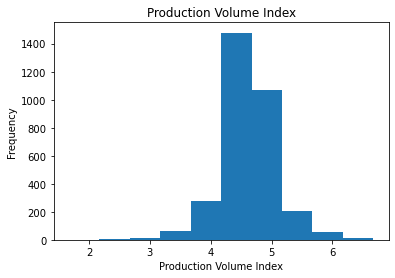

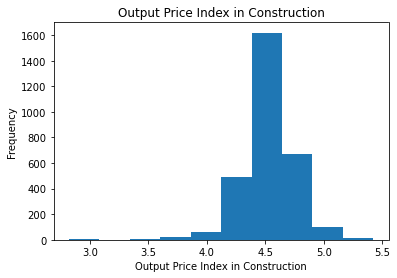

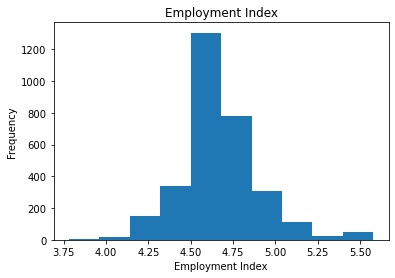

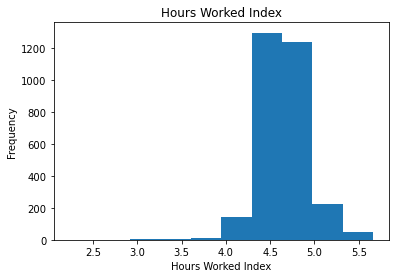

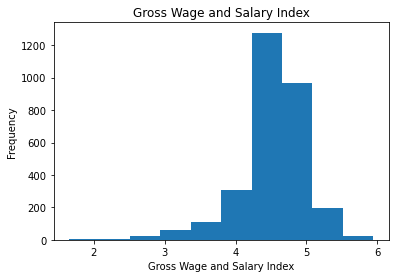

...

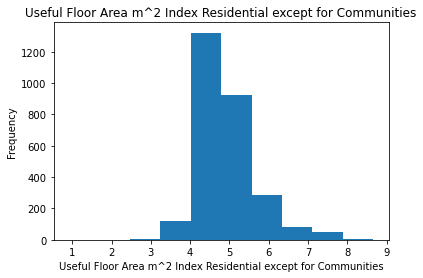

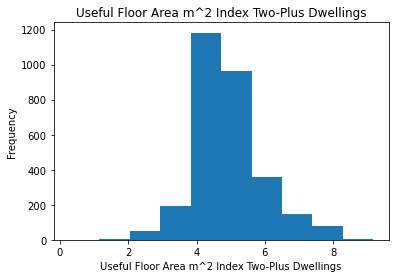

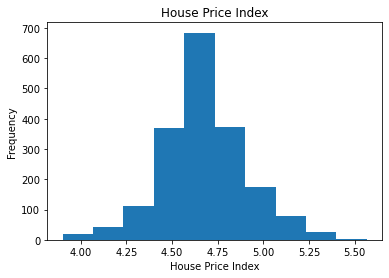

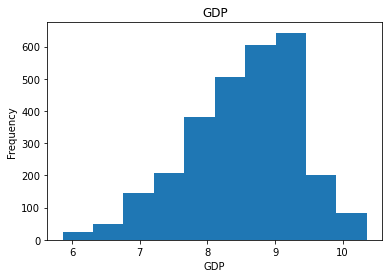

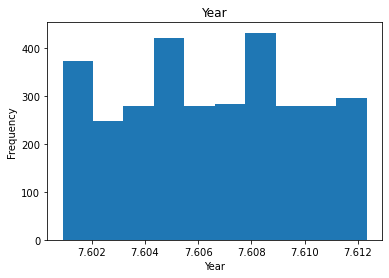

In [36]:
df_histograms(data_log_trans)

<Figure size 432x288 with 0 Axes>

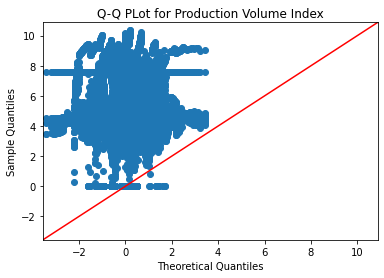

<Figure size 432x288 with 0 Axes>

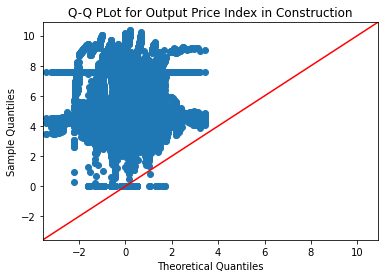

<Figure size 432x288 with 0 Axes>

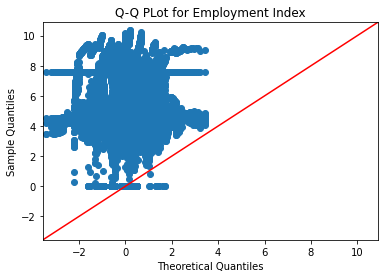

<Figure size 432x288 with 0 Axes>

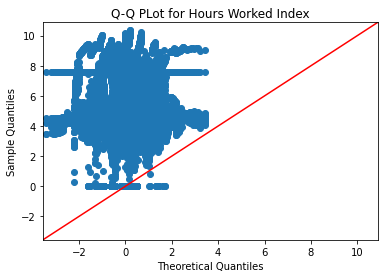

<Figure size 432x288 with 0 Axes>

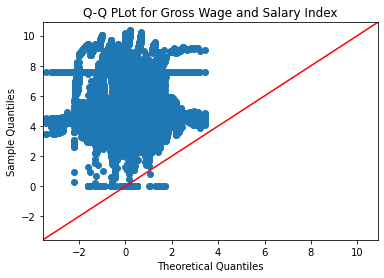

<Figure size 432x288 with 0 Axes>

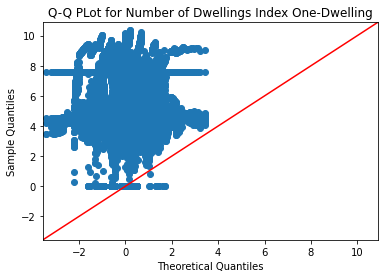

<Figure size 432x288 with 0 Axes>

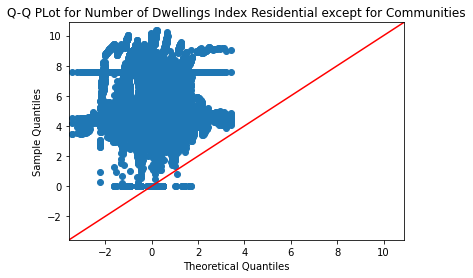

<Figure size 432x288 with 0 Axes>

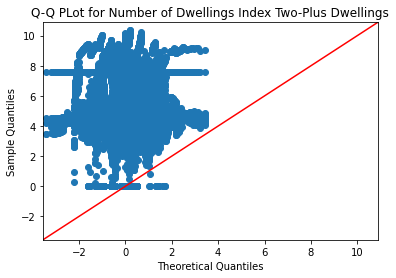

<Figure size 432x288 with 0 Axes>

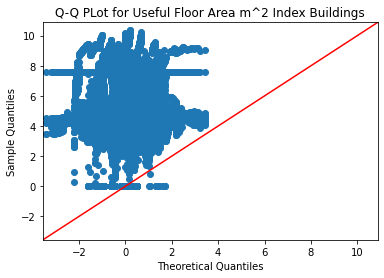

<Figure size 432x288 with 0 Axes>

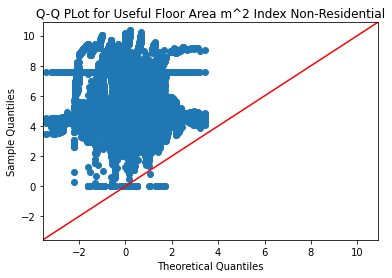

<Figure size 432x288 with 0 Axes>

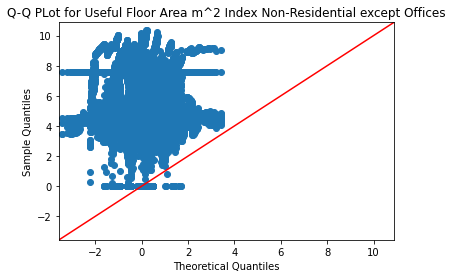

<Figure size 432x288 with 0 Axes>

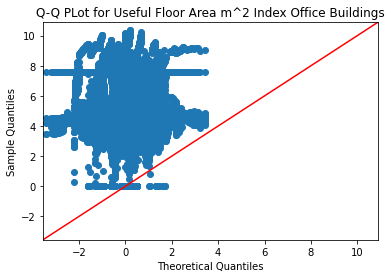

<Figure size 432x288 with 0 Axes>

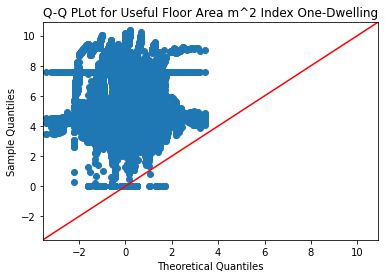

<Figure size 432x288 with 0 Axes>

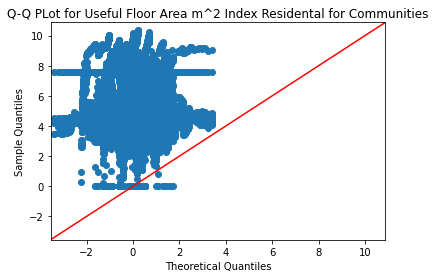

<Figure size 432x288 with 0 Axes>

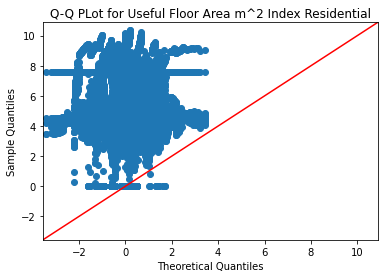

<Figure size 432x288 with 0 Axes>

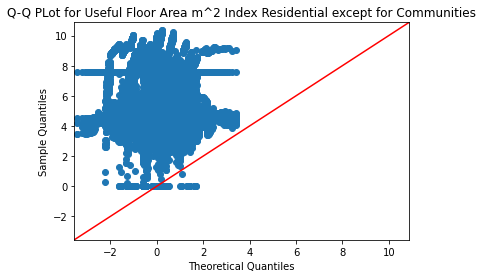

<Figure size 432x288 with 0 Axes>

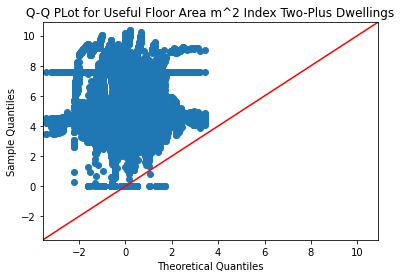

<Figure size 432x288 with 0 Axes>

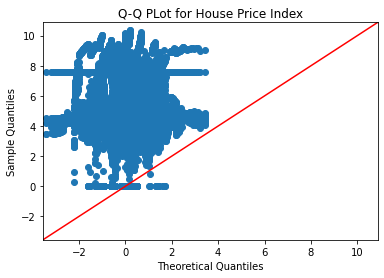

<Figure size 432x288 with 0 Axes>

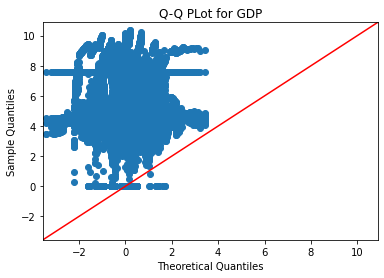

<Figure size 432x288 with 0 Axes>

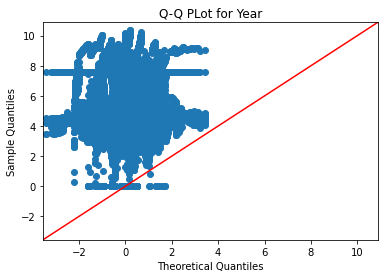

In [37]:
#creating quantile quantile plots for each column for all data
df_qqplot(data_log_trans)

In [38]:
#creating a data set specifically with Ireland data and Index Columns
data_log_ie = data_boxcox
data_log_ie=data_log_ie[data_log_ie['Country']=='IE']
data_log_ie=data_log_ie.iloc[:, [2,4,6,7,12,13,14,15,16,17,18,19,20,21,22,23,36,38]]

<Figure size 432x288 with 0 Axes>

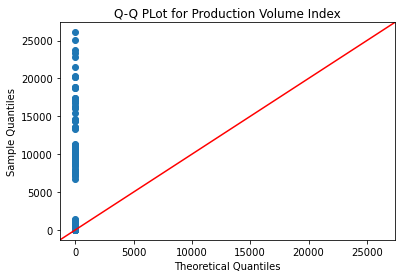

<Figure size 432x288 with 0 Axes>

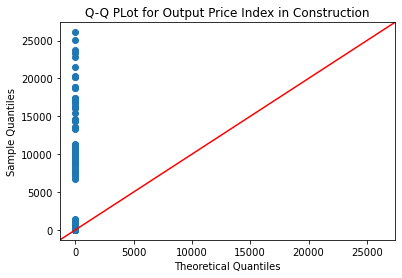

<Figure size 432x288 with 0 Axes>

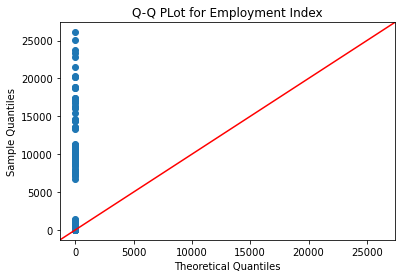

<Figure size 432x288 with 0 Axes>

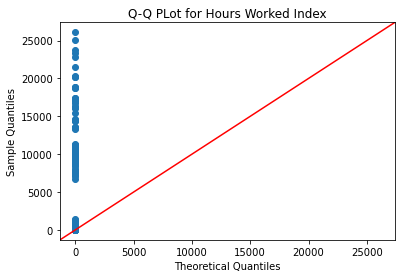

<Figure size 432x288 with 0 Axes>

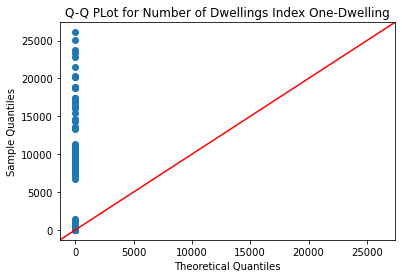

<Figure size 432x288 with 0 Axes>

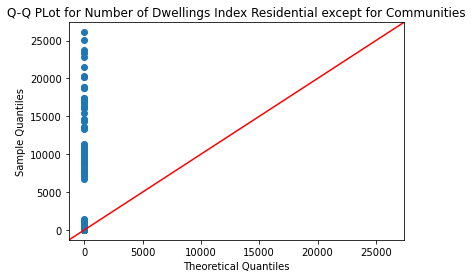

<Figure size 432x288 with 0 Axes>

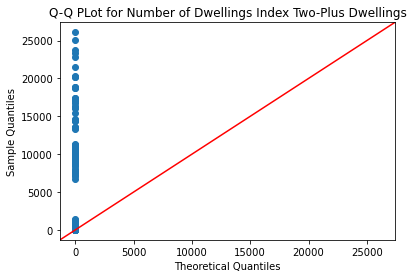

<Figure size 432x288 with 0 Axes>

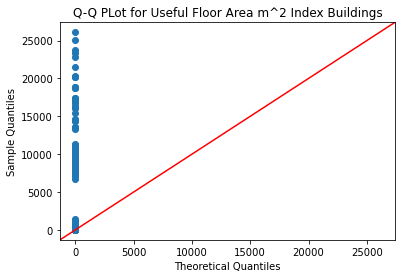

<Figure size 432x288 with 0 Axes>

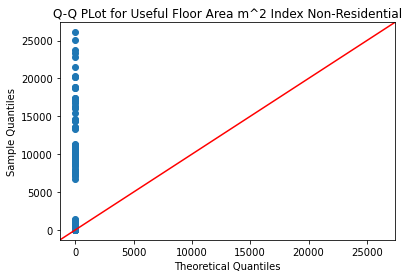

<Figure size 432x288 with 0 Axes>

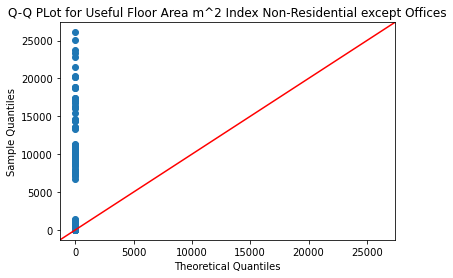

<Figure size 432x288 with 0 Axes>

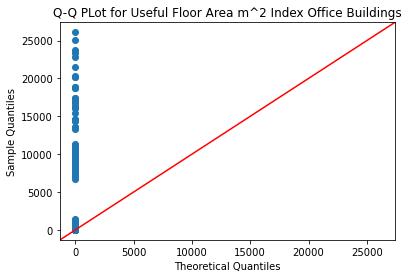

<Figure size 432x288 with 0 Axes>

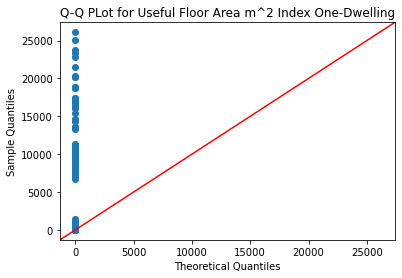

<Figure size 432x288 with 0 Axes>

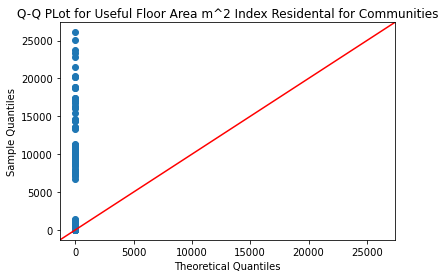

<Figure size 432x288 with 0 Axes>

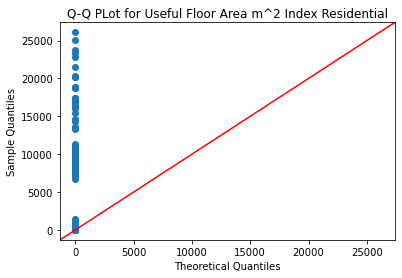

<Figure size 432x288 with 0 Axes>

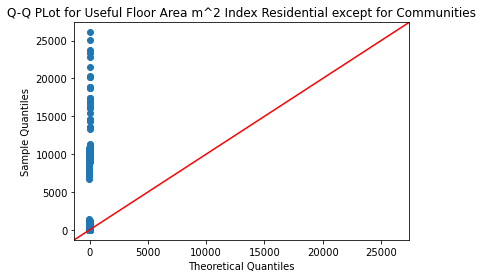

<Figure size 432x288 with 0 Axes>

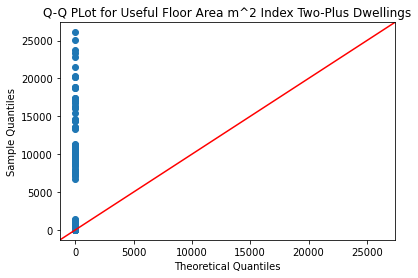

<Figure size 432x288 with 0 Axes>

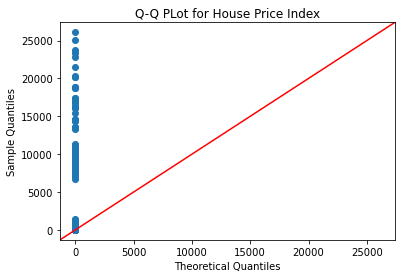

<Figure size 432x288 with 0 Axes>

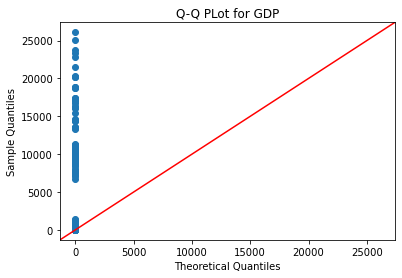

In [39]:
#creating quantile quantile plots for each column for irish data
df_qqplot(data_log_ie)

#### Section 2.2.1.1.3 Square Root Transformation

In [40]:
data_sq=data_log[numeric_cols]**(1/2)
data_sq.head()

,Production Volume Index,Output Price Index in Construction,Employment Index,Hours Worked Index,Gross Wage and Salary Index,Number of Dwellings Index One-Dwelling,Number of Dwellings Index Residential except for Communities,Number of Dwellings Index Two-Plus Dwellings,Useful Floor Area m^2 Index Buildings,Useful Floor Area m^2 Index Non-Residential,Useful Floor Area m^2 Index Non-Residential except Offices,Useful Floor Area m^2 Index Office Buildings,Useful Floor Area m^2 Index One-Dwelling,Useful Floor Area m^2 Index Residental for Communities,Useful Floor Area m^2 Index Residential,Useful Floor Area m^2 Index Residential except for Communities,Useful Floor Area m^2 Index Two-Plus Dwellings,House Price Index,GDP,Year
0,5.753260,9.633276,8.234076,NaN,5.621388,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44.777226
1,7.190271,9.617692,8.270429,NaN,5.787918,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44.777226
2,6.957011,9.607289,8.068457,NaN,5.692100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44.777226
3,8.117881,9.617692,8.012490,NaN,5.683309,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44.777226
4,6.049793,9.617692,8.203658,NaN,5.770615,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44.788391


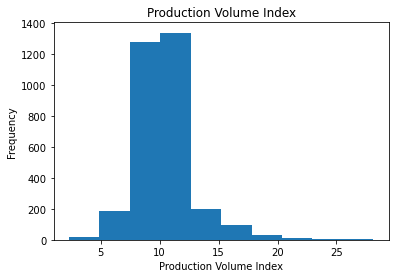

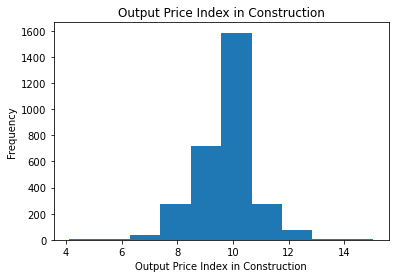

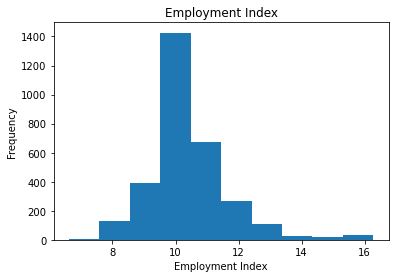

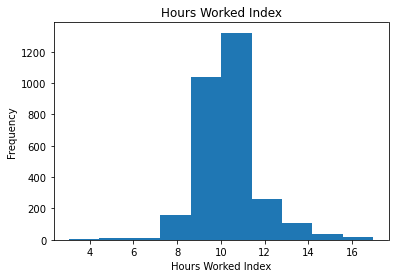

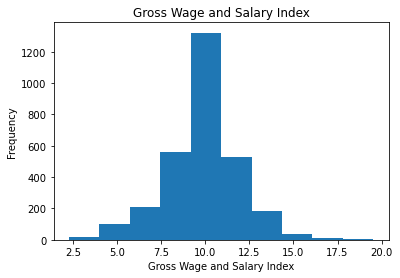

...

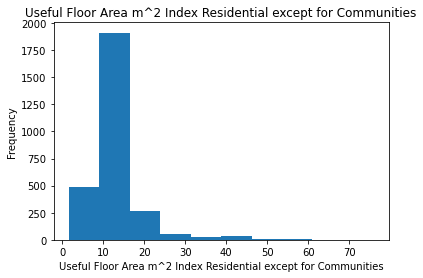

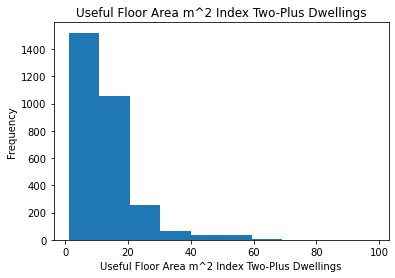

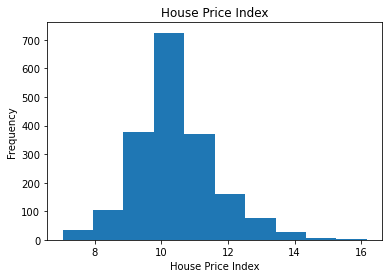

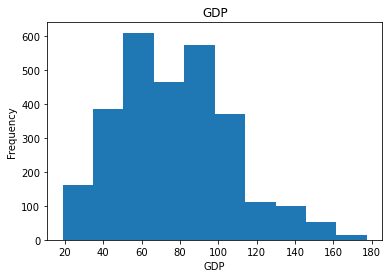

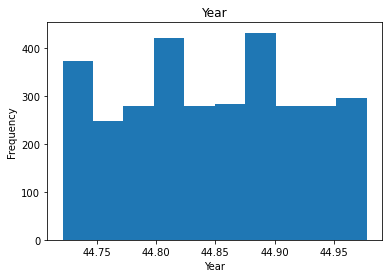

In [41]:
df_histograms(data_sq)

<Figure size 432x288 with 0 Axes>

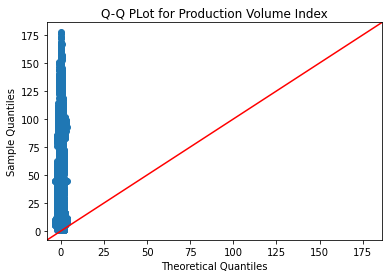

<Figure size 432x288 with 0 Axes>

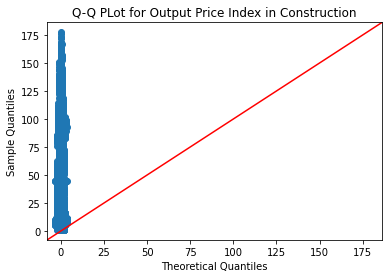

<Figure size 432x288 with 0 Axes>

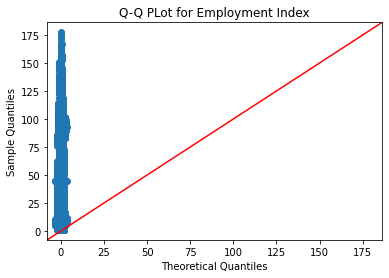

<Figure size 432x288 with 0 Axes>

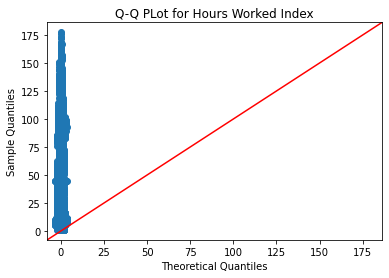

<Figure size 432x288 with 0 Axes>

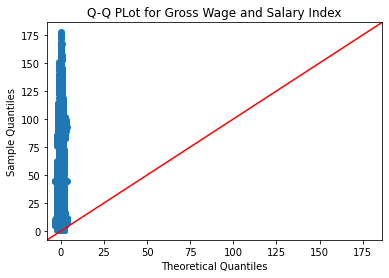

<Figure size 432x288 with 0 Axes>

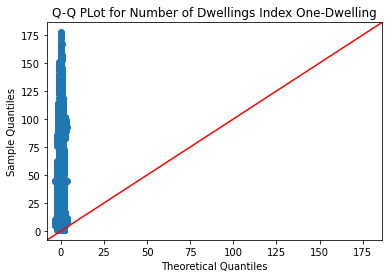

<Figure size 432x288 with 0 Axes>

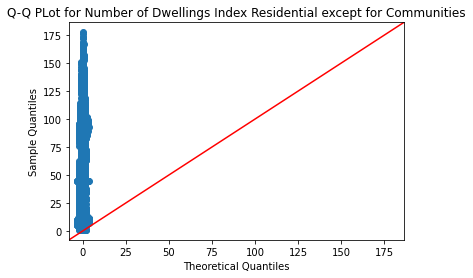

<Figure size 432x288 with 0 Axes>

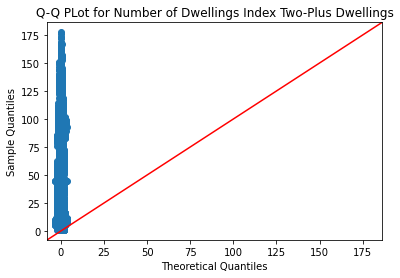

<Figure size 432x288 with 0 Axes>

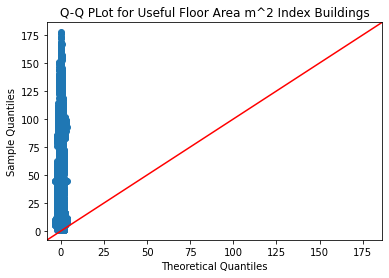

<Figure size 432x288 with 0 Axes>

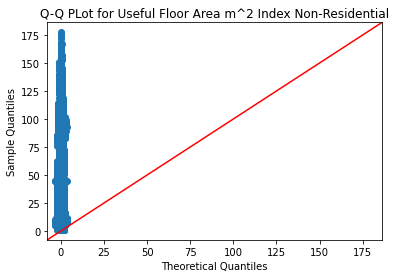

<Figure size 432x288 with 0 Axes>

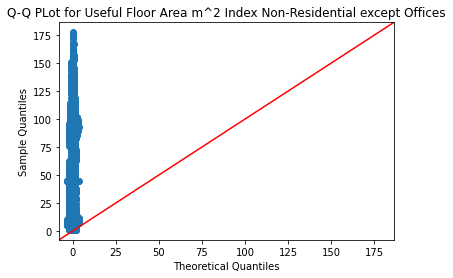

<Figure size 432x288 with 0 Axes>

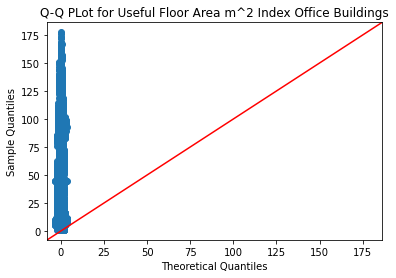

<Figure size 432x288 with 0 Axes>

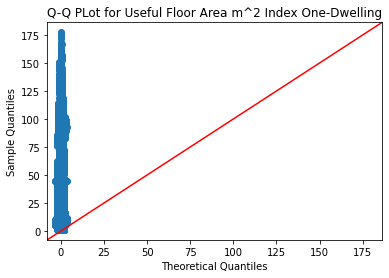

<Figure size 432x288 with 0 Axes>

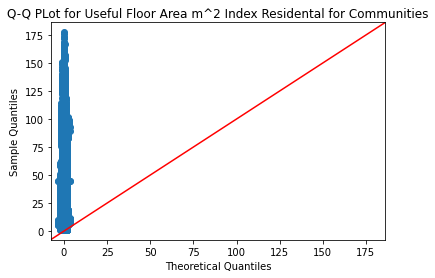

<Figure size 432x288 with 0 Axes>

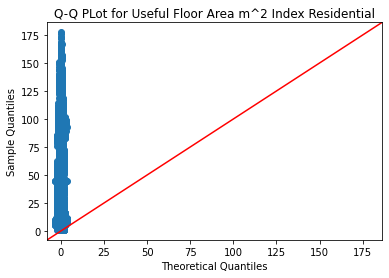

<Figure size 432x288 with 0 Axes>

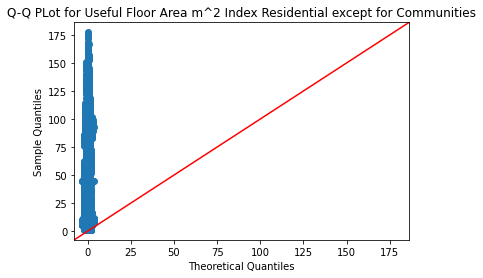

<Figure size 432x288 with 0 Axes>

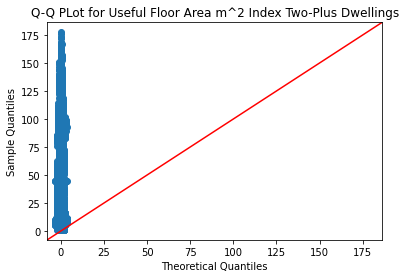

<Figure size 432x288 with 0 Axes>

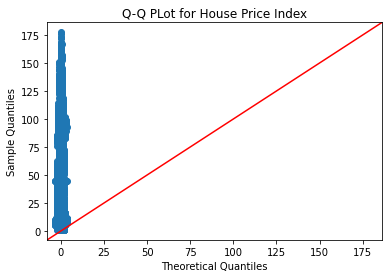

<Figure size 432x288 with 0 Axes>

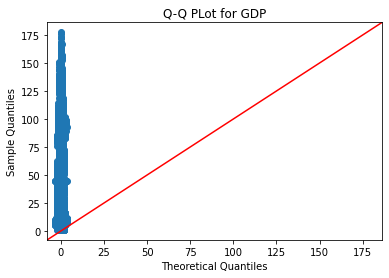

<Figure size 432x288 with 0 Axes>

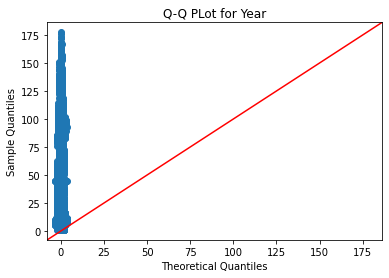

In [42]:
df_qqplot(data_sq)

In [43]:
#creating a data set specifically with Ireland data and Index Columns
data_sq_ie = data_boxcox
data_sq_ie=data_sq_ie[data_sq_ie['Country']=='IE']
data_sq_ie=data_sq_ie.iloc[:, [2,4,6,7,8,12,13,14,15,16,17,18,19,20,21,22,23,36,38,40]]
data_sq_ie=data_sq_ie[numeric_cols]**(1/2)
data_sq_ie.head()

,Production Volume Index,Output Price Index in Construction,Employment Index,Hours Worked Index,Gross Wage and Salary Index,Number of Dwellings Index One-Dwelling,Number of Dwellings Index Residential except for Communities,Number of Dwellings Index Two-Plus Dwellings,Useful Floor Area m^2 Index Buildings,Useful Floor Area m^2 Index Non-Residential,Useful Floor Area m^2 Index Non-Residential except Offices,Useful Floor Area m^2 Index Office Buildings,Useful Floor Area m^2 Index One-Dwelling,Useful Floor Area m^2 Index Residental for Communities,Useful Floor Area m^2 Index Residential,Useful Floor Area m^2 Index Residential except for Communities,Useful Floor Area m^2 Index Two-Plus Dwellings,House Price Index,GDP,Year
1484,14.380542,7.758866,10.620734,10.816654,8.648699,25.880495,25.596875,24.529574,12.597619,18.862662,13.122500,9.497368,23.340951,4.049691,22.869193,23.143034,21.730163,NaN,82.219219,44.721360
1485,14.717337,7.981228,10.844353,11.031772,8.944272,27.219478,26.499057,23.670657,13.187115,19.679939,13.682105,10.315038,24.533650,7.402702,23.841141,24.108090,20.954713,NaN,84.023806,44.721360
1486,15.122830,8.148620,11.126545,11.357817,9.370165,27.638741,27.539063,27.171676,15.949922,21.014281,16.294171,14.081903,24.661711,16.670333,24.505102,24.667793,24.708298,NaN,84.852814,44.721360
1487,14.889594,8.318654,11.224972,11.410521,9.823441,26.581949,26.118959,24.347484,13.780421,19.783832,14.307341,10.700467,24.137108,21.147104,23.717082,23.776038,21.132913,NaN,86.544786,44.721360
1488,14.577380,8.596511,11.264990,11.322544,9.518403,25.369273,26.302091,29.468627,15.427249,20.059910,14.113823,20.947554,23.039097,7.402702,23.280893,23.539329,26.726391,NaN,88.090862,44.732538


<Figure size 432x288 with 0 Axes>

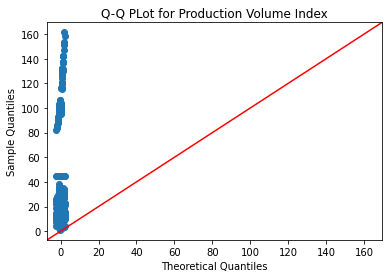

<Figure size 432x288 with 0 Axes>

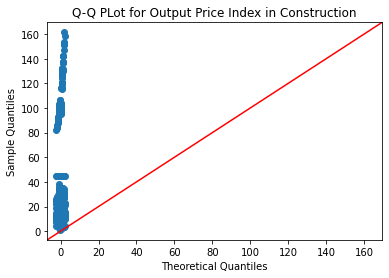

<Figure size 432x288 with 0 Axes>

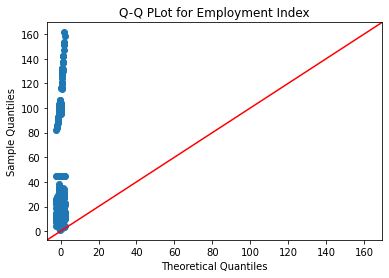

<Figure size 432x288 with 0 Axes>

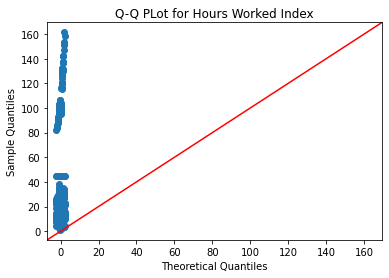

<Figure size 432x288 with 0 Axes>

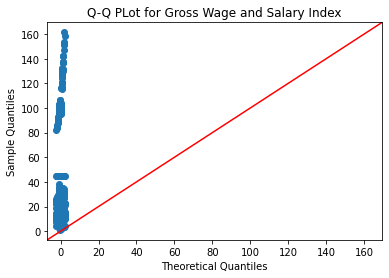

<Figure size 432x288 with 0 Axes>

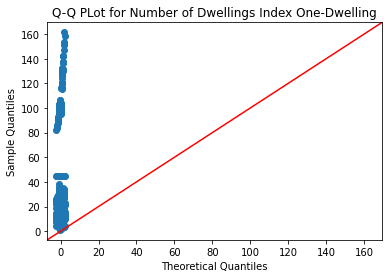

<Figure size 432x288 with 0 Axes>

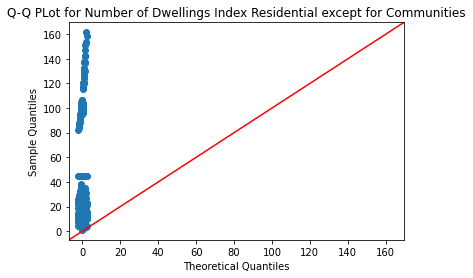

<Figure size 432x288 with 0 Axes>

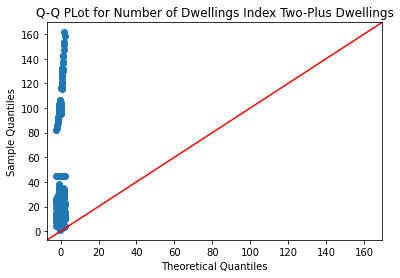

<Figure size 432x288 with 0 Axes>

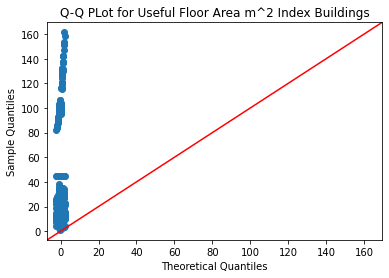

<Figure size 432x288 with 0 Axes>

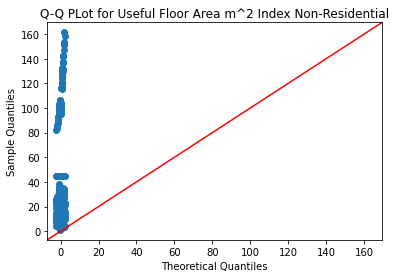

<Figure size 432x288 with 0 Axes>

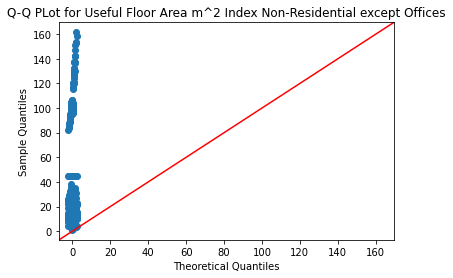

<Figure size 432x288 with 0 Axes>

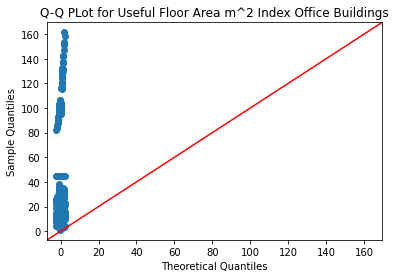

<Figure size 432x288 with 0 Axes>

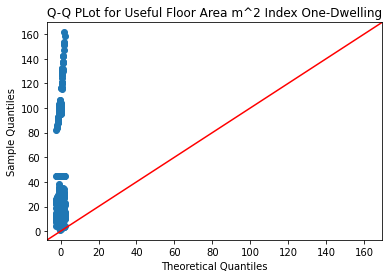

<Figure size 432x288 with 0 Axes>

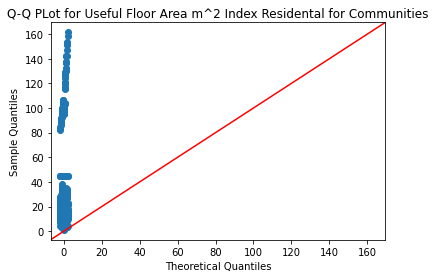

<Figure size 432x288 with 0 Axes>

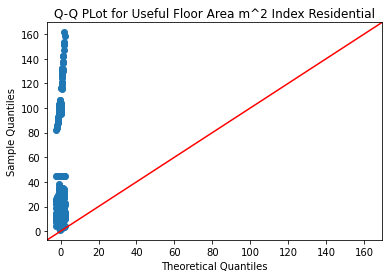

<Figure size 432x288 with 0 Axes>

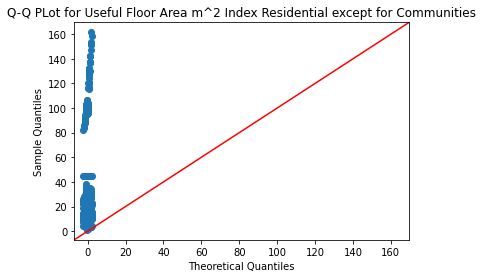

<Figure size 432x288 with 0 Axes>

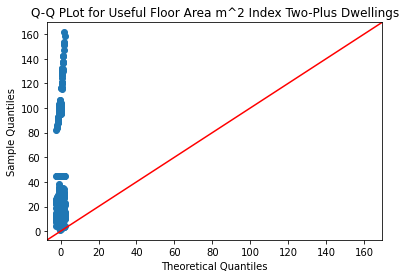

<Figure size 432x288 with 0 Axes>

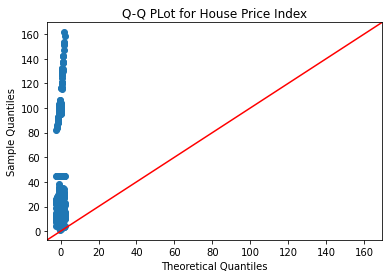

<Figure size 432x288 with 0 Axes>

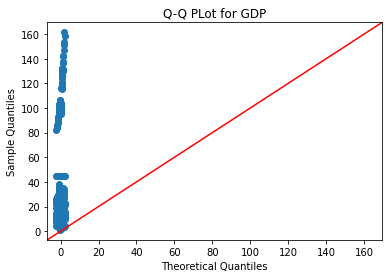

<Figure size 432x288 with 0 Axes>

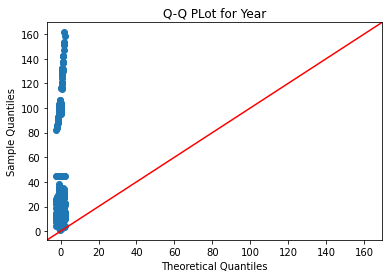

In [44]:
df_qqplot(data_sq_ie)

### Section 2.2.1.2 Boxplots

In [45]:
#creating a subset of the main data to create boxplots later
data_all_box=data_stats.iloc[:, [0,2,4,6,7,12,13,14,15,16,17,18,19,20,21,22,23,36,38]]

In [46]:
df_boxplots(data_all_box, 'Country')

In [47]:
#creating dataframe to look at the correlations for all data
data_pair=data_stats.iloc[:, [2,4,6,7,12,13,14,15,16,17,18,19,20,21,22,23,36,38]]

In [48]:
#creating pair plot
#sns.pairplot(data_pair)
#too many parameters in plot and difficult to visualise and data is not normally distributed

In [49]:
#looking at the correlations between the parameters
data_corr=data_pair.corr(method='spearman').style.background_gradient(cmap="seismic")
#writing it to a html to get a better view of the table and to copy into the report
with open('spearman_correlations.html', 'w') as f:
    f.write(data_corr.to_html())

In [50]:
#creating a subset for just ireland to see if the correlations are better or worse
data_ire = data_stats[data_stats['Country']=='IE']
data_pair_ie=data_ire.iloc[:, [2,4,6,7,12,13,14,15,16,17,18,19,20,21,22,23,36,38]]

In [51]:
#looking at the correlations between the parameters
data_pair_ie.corr(method='spearman').style.background_gradient(cmap="seismic")

,Production Volume Index,Output Price Index in Construction,Employment Index,Hours Worked Index,Number of Dwellings Index One-Dwelling,Number of Dwellings Index Residential except for Communities,Number of Dwellings Index Two-Plus Dwellings,Useful Floor Area m^2 Index Buildings,Useful Floor Area m^2 Index Non-Residential,Useful Floor Area m^2 Index Non-Residential except Offices,Useful Floor Area m^2 Index Office Buildings,Useful Floor Area m^2 Index One-Dwelling,Useful Floor Area m^2 Index Residental for Communities,Useful Floor Area m^2 Index Residential,Useful Floor Area m^2 Index Residential except for Communities,Useful Floor Area m^2 Index Two-Plus Dwellings,House Price Index,GDP
Production Volume Index,1.000000,0.158707,0.819360,0.825797,0.919373,0.919542,0.783111,0.900414,0.941251,0.909534,0.640445,0.923915,0.187811,0.929360,0.929349,0.790905,0.817452,-0.113237
Output Price Index in Construction,0.158707,1.000000,0.625320,0.603931,0.019791,0.043640,0.224783,0.174134,0.156611,0.205108,-0.121207,0.065177,0.412039,0.081761,0.082644,0.231247,0.922951,0.843929
Employment Index,0.819360,0.625320,1.000000,0.988787,0.729412,0.748842,0.760138,0.791780,0.811654,0.817019,0.454655,0.755918,0.399128,0.770865,0.771939,0.774405,0.946168,0.350614
Hours Worked Index,0.825797,0.603931,0.988787,1.000000,0.734564,0.742130,0.742240,0.786855,0.808150,0.810032,0.461130,0.761166,0.407624,0.768796,0.768984,0.756156,0.935959,0.344035
Number of Dwellings Index One-Dwelling,0.919373,0.019791,0.729412,0.734564,1.000000,0.979871,0.795786,0.882783,0.963565,0.890574,0.638788,0.993608,0.200376,0.985451,0.985385,0.796090,0.817705,-0.230663
Number of Dwellings Index Residential except for Communities,0.919542,0.043640,0.748842,0.742130,0.979871,1.000000,0.879105,0.885988,0.969730,0.896438,0.630038,0.973236,0.186402,0.992941,0.993608,0.877460,0.855503,-0.214728
Number of Dwellings Index Two-Plus Dwellings,0.783111,0.224783,0.760138,0.742240,0.795786,0.879105,1.000000,0.750974,0.838863,0.767365,0.497152,0.790792,0.279727,0.857605,0.859250,0.992741,0.836710,0.045351
Useful Floor Area m^2 Index Buildings,0.900414,0.174134,0.791780,0.786855,0.882783,0.885988,0.750974,1.000000,0.956509,0.992359,0.781137,0.896444,0.220993,0.902750,0.901301,0.769433,0.765978,-0.122350
Useful Floor Area m^2 Index Non-Residential,0.941251,0.156611,0.811654,0.808150,0.963565,0.969730,0.838863,0.956509,1.000000,0.962512,0.687432,0.974187,0.229804,0.983686,0.983243,0.848900,0.846258,-0.143861
Useful Floor Area m^2 Index Non-Residential except Offices,0.909534,0.205108,0.817019,0.810032,0.890574,0.896438,0.767365,0.992359,0.962512,1.000000,0.715335,0.906139,0.239539,0.913169,0.912024,0.784653,0.796704,-0.097574


In [52]:
#sns.pairplot(data_pair_ie)

## Section 2.3 Inferential Statistics

### Section 2.3.1 Inferential Statistics for Possible Population Values

In [58]:
#subsetting to get population for the Production Volume Index
data_pvi = data_stats[['Country', 'Year-Quarter', 'Production Volume Index', 'Year', 'Quarter']]

In [55]:
data_pvi['Year'].unique()

array([2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015,
       2016, 2017, 2018, 2019, 2020, 2021, 2022, 2000, 2001, 2002, 2003,
       2004, 2023], dtype=int64)

In [60]:
#kruskal wallis test to determine if there are differences in medians every 5 years
#Hypothesis
#H0: The medians for Production Volume Index every five years are equal
#Ha: The medians for Production Volume Index every five years are not equal

#creating subsets
data_2000=data_pvi.query('Year == 2000')['Production Volume Index'].sample(n=50, random_state=42).to_list()
data_2005=data_pvi.query('Year == 2005')['Production Volume Index'].sample(n=50, random_state=42).to_list()
data_2010=data_pvi.query('Year == 2010')['Production Volume Index'].sample(n=50, random_state=42).to_list()
data_2015=data_pvi.query('Year == 2015')['Production Volume Index'].sample(n=50, random_state=42).to_list()
data_2020=data_pvi.query('Year == 2020')['Production Volume Index'].sample(n=50, random_state=42).to_list()

In [66]:
#performing kruskal-wallis 
statistic, p_value= stats.kruskal(data_2000,data_2005,data_2010,data_2015,data_2020)
print('Statistic Value:', statistic)
print('p-value:', p_value)

if p_value < 0.05:
    print('Reject the Null Hypothesis, The medians for Production Volume Index every five years are not equal')
else:
    print('Fail to Reject the Null Hypothesis, The medians for Production Volume every five years are equal')

Statistic Value: 19.53730584536599
p-value: 0.0006161540674819821
Reject the Null Hypothesis, The medians for Production Volume Index every five years are not equal


In [64]:
#kruskal wallis test to determine if there are differences in medians for last 3 years - 2023 was excluded as data not complete
#Hypothesis
#H0: The medians for Production Volume Index for last three years are equal
#Ha: The medians for Production Volume Index for last three years are not equal

#creating subsets
data_2022=data_pvi.query('Year == 2022')['Production Volume Index'].sample(n=50, random_state=42).to_list()
data_2021=data_pvi.query('Year == 2021')['Production Volume Index'].sample(n=50, random_state=42).to_list()

In [65]:
#performing kruskal-wallis 
statistic, p_value= stats.kruskal(data_2021,data_2022,data_2020)
print('Statistic Value:', statistic)
print('p-value:', p_value)

if p_value < 0.05:
    print('Reject the Null Hypothesis, The medians for Production Volume Index for last three years are not equal')
else:
    print('Fail to Reject the Null Hypothesis, The medians for Production Volume Index for last three years are equal')

Statistic Value: 3.0120958207326103
p-value: 0.22178476146606121
Fail to Reject the Null Hypothesis, The medians for Production Volume Index for last three years are equal


### Section 2.3.2 Inferential Statistics for Ireland vs EU Countries

A 2018 report by the housing agency in Ireland concluded that the construction costs for residental buildings in Ireland, UK, Germany and France were comparable. The similarities between these countries will be assessed using inferential statistics. Source: https://www.housingagency.ie/sites/default/files/publications/5.%20Comparison-of-Residential-Construction-Costs-in-Ireland-to-other-European-Countries-2018.pdf

In [ ]:
#viewing the dataset
data_stats.info()

### Section 2.3.2.1 Data Prep for Inferential Statistics

In [ ]:
#getting the country codes
data_stats['Country'].unique()

In [ ]:
#subsetting the data for countries required
data_eu_ie = data_stats.query("Country in ['IE', 'UK', 'FR', 'DE']")

In [ ]:
#checking subset happened correctly
data_eu_ie['Country'].unique()

In [ ]:
#viewing info on new df
data_eu_ie.info()

In [ ]:
#removing the flag data as not required for these statistics methods
data_eu_ie = data_eu_ie[[col for col in data_eu_ie.columns if 'Flag' not in col]]
#checking columns were removed
data_eu_ie.info()

In [ ]:
#look at descriptive stats
data_eu_ie.describe()

### Section 2.3.2.2 Checking for Normality for Inferential Statistics

In [ ]:
#viewing the q-q plots to see if data is normal
data_eu_ie_graph = data_eu_ie.iloc[:,2:20]
df_qqplot(data_eu_ie_graph)

In [ ]:
#viewing histograms to see disctribution of data
df_histograms(data_eu_ie_graph)

In [ ]:
#transforming data with boxcox to see if that will bring it to normality
eu_ie_boxcox_final=data_eu_ie.copy()
#performing boxcox transformation on all data
for column in numeric_cols:
    drop_data = data_eu_ie[column].dropna()
    missing_data = data_eu_ie[column].loc[data_eu_ie[column].isna()]
    
    eu_ie_boxcox_final.loc[drop_data.index, column], trans_lambda = boxcox(drop_data)
    eu_ie_boxcox_final.loc[missing_data.index, column]=np.nan

In [ ]:
#viewing the q-q plots to see if data is normal
boxcox_graph = eu_ie_boxcox_final.iloc[:,2:20]
df_qqplot(boxcox_graph)

In [ ]:
#viewing histograms to see disctribution of data
df_histograms(boxcox_graph)

In [ ]:
data_fr=data_eu_ie.query("Country == 'FR'")
df_histograms(data_fr)

In [ ]:
data_de=data_eu_ie.query("Country == 'DE'")
df_histograms(data_de)

In [ ]:
data_ie=data_eu_ie.query("Country == 'IE'")
df_histograms(data_ie)

In [ ]:
data_uk=data_eu_ie.query("Country == 'UK'")
df_histograms(data_uk)

### Section 2.3.2.3 Mann-Whitney U Test

Compares the median of two samples

Assumptions for Mann-Whitney U:
1. observations are independent
2. values are in an ordinal manner
3. sample size of <20 recommended
4. data does not need to be normally distributed but must be of similar shape

https://www.geeksforgeeks.org/mann-and-whitney-u-test/
https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.mannwhitneyu.html

Hypothesis:
   - H0: There is no significent difference between Ireland and UK for Employment Index
   - Ha: There is a significent difference between Ireland and UK for Employment Index

Significence Level is 0.05

In [ ]:
#subsetting data for the parameter, sample size and converting to list
data_ie_mwu=data_ie['Employment Index'].sample(n=20, random_state=42).to_list()

In [ ]:
#viewing histogram to compare the shapes
plt.hist(data_ie['Employment Index'])
plt.title('Histogram of Employment Index for Ireland')
plt.xlabel('Index')
plt.ylabel('Frequency')
plt.show()

In [ ]:
#subsetting data for the parameter, sample size and converting to list
data_uk_mwu=data_uk['Employment Index'].sample(n=20, random_state=42).to_list()

In [ ]:
#viewing histogram to compare the shapes
plt.hist(data_uk['Employment Index'])
plt.title('Histogram of Employment Index for UK')
plt.xlabel('Index')
plt.ylabel('Frequency')
plt.show()

In [ ]:
#perform test
statistic, p_value = mannwhitneyu(data_ie_mwu, data_uk_mwu)
print('Statistic Value:', statistic)
print('p-value:', p_value)

if p_value < 0.05:
    print('Reject the Null Hypothesis, there is a significent difference between Ireland and UK for Employment Index')
else:
    print('Fail to Reject the Null Hypothesis, there is no significent difference between Ireland and UK for Employment Index')

In [ ]:
#defining a fucntion to calculate manu whit across all columns for two dataframes, it starts by comparing the columns in botht o make sure they are the same, only numeric columsn are choosen
def mannwhitneyu_calc(df1, df2):
    common_cols = set(df1.columns) & set(df2.columns)
    if not common_cols:
        print("No common columns found between df1 and df2")
        return
    
    results={}
  
    for column in common_cols:
        if df1[column].dtype in ['int64', 'float64'] and df2[column].dtype in ['int64', 'float64']:
            df1_drop = df1[column].dropna().sample(n=20, random_state=42)
            df2_drop = df2[column].dropna().sample(n=20, random_state=42)
            
            statistic, p_value = mannwhitneyu(df1_drop, df2_drop)
            results[column] = {'Statistic Value': statistic, 'p-value': p_value}
        
    result_df = pd.DataFrame(results)
    return result_df

In [ ]:
#calculating man whitney u for Ireland vs UK data
manu_all =mannwhitneyu_calc(data_ie, data_uk)
#subsetting dataframe to only show those where fail to reject null hypothesis and there is no significent difference between countries
manu_all.loc[:, manu_all.iloc[1] > 0.05]

In [ ]:
#calculating man whitney u for Ireland vs Germany data
manu_all =mannwhitneyu_calc(data_ie, data_de)
#subsetting dataframe to only show those where fail to reject null hypothesis and there is no significent difference between countries
manu_all.loc[:, manu_all.iloc[1] > 0.05]

In [ ]:
#calculating man whitney u for Ireland vs France data
manu_all =mannwhitneyu_calc(data_ie, data_fr)
#subsetting dataframe to only show those where fail to reject null hypothesis and there is no significent difference between countries
manu_all.loc[:, manu_all.iloc[1] > 0.05]

### Section 2.3.2.4 Wilcoxon Signed-Rank Test

Compares the median to determine if samples are identically distributed

Assumptions:
1. population distribution is symmetric
2. randomly sampled
3. observations are from the same population

Source: Introductory Statistics by Neil Weiss
https://pythonfordatascienceorg.wordpress.com/wilcoxon-sign-ranked-test-python/
https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.wilcoxon.html
https://www.geeksforgeeks.org/how-to-conduct-a-wilcoxon-signed-rank-test-in-python/

Hypothesis:
   - H0: Sample Distribution for Ireland Employment Index Before and After the Recession are Equal
   - Ha: Sample Distribution for Ireland Employment Index Before and After the Recession are not Equal

Significence Level is 0.05

In [ ]:
#creating data subsets
data_ie_before=data_ie.query('Year <2008')
data_ie_after=data_ie.query('Year >2014')
data_ie_before=data_ie_before['Employment Index'].sample(n=20, random_state=42).to_list()
data_ie_after=data_ie_after['Employment Index'].sample(n=20, random_state=42).to_list()

In [ ]:
#creating data subsets
data_de_before=data_de.query('Year <2008')
data_de_after=data_de.query('Year >2014')
data_de_before=data_de_before['Employment Index'].sample(n=20, random_state=42).to_list()
data_de_after=data_de_after['Employment Index'].sample(n=20, random_state=42).to_list()

In [ ]:
#performing wilcoxon for irish data
statistic, p_value= stats.wilcoxon(data_ie_before, data_ie_after)
print('Statistic Value:', statistic)
print('p-value:', p_value)

if p_value < 0.05:
    print('Reject the Null Hypothesis, Sample Distribution for Ireland Employment Index Before and After the Recession are not Equal')
else:
    print('Fail to Reject the Null Hypothesis, Sample Distribution for Ireland Employment Index Before and After the Recession are Equal')

In [ ]:
#performing wilcoxon for german data
statistic, p_value= stats.wilcoxon(data_de_before, data_de_after)
print('Statistic Value:', statistic)
print('p-value:', p_value)

if p_value < 0.05:
    print('Reject the Null Hypothesis, Sample Distribution for German Employment Index Before and After the Recession are not Equal')
else:
    print('Fail to Reject the Null Hypothesis, Sample Distribution for German Employment Index Before and After the Recession are Equal')

In [ ]:
#defining a fucntion to calculate Wilcoxon across all columns for two dataframes, it starts by comparing the columns in botht o make sure they are the same, only numeric columsn are choosen
def wilcoxon_calc(df1, df2):
    common_cols = set(df1.columns) & set(df2.columns)
    if not common_cols:
        print("No common columns found between df1 and df2")
        return
    
    results={}
  
    for column in common_cols:
        if df1[column].dtype in ['int64', 'float64'] and df2[column].dtype in ['int64', 'float64']:
            df1_drop = df1[column].dropna().sample(n=20, random_state=42)
            df2_drop = df2[column].dropna().sample(n=20, random_state=42)
            
            statistic, p_value = stats.wilcoxon(df1_drop, df2_drop)
            results[column] = {'Statistic Value': statistic, 'p-value': p_value}
        
    result_df = pd.DataFrame(results)
    return result_df

### Section 2.3.2.5 Kruskal-Wallis Test

Determine if there is a statistically significent difference between the medians of three or more independent groups

Assumptions:
1. Independent variables with one or more groups
2. values are ranked
3. Doesn't require a specific distribution

Source:
https://www.geeksforgeeks.org/how-to-perform-a-kruskal-wallis-test-in-python/
https://www.statology.org/kruskal-wallis-test-python/
https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.kruskal.html

Hypothesis:
   - H0: The medians of Production Volume Index for Ireland, Germany, France and the UK  are equal
   - Ha: The medians of Production Volume Index for Ireland, Germany, France and the UK are not equal

Significence Level is 0.05

In [ ]:
#generating data lists
data_ie_kw = data_ie['Production Volume Index'].sample(n=50, random_state=42).to_list()
data_uk_kw = data_uk['Production Volume Index'].sample(n=50, random_state=42).to_list()
data_de_kw = data_de['Production Volume Index'].sample(n=50, random_state=42).to_list()
data_fr_kw = data_fr['Production Volume Index'].sample(n=50, random_state=42).to_list()

In [ ]:
#performing kruskal-wallis 
statistic, p_value= stats.kruskal(data_ie_kw,data_uk_kw,data_de_kw,data_fr_kw)
print('Statistic Value:', statistic)
print('p-value:', p_value)

if p_value < 0.05:
    print('Reject the Null Hypothesis, the medians of Production Volume Index for Ireland, Germany, France and the UK are not equal')
else:
    print('Fail to Reject the Null Hypothesis, the medians of Production Volume Index for Ireland, Germany, France and the UK  are equal')

In [ ]:
#defining a fucntion to calculate kruskal across all columns for two dataframes, it starts by comparing the columns in botht o make sure they are the same, only numeric columsn are choosen
def kruskal_calc(df1, df2,df3,df4):
    common_cols = set(df1.columns) & set(df2.columns) & set(df3.columns) & set(df4.columns)
    if not common_cols:
        print("No common columns found between dfs")
        return
    
    results={}
  
    for column in common_cols:
        if df1[column].dtype in ['int64', 'float64'] and df2[column].dtype in ['int64', 'float64'] and df3[column].dtype in ['int64', 'float64'] and df4[column].dtype in ['int64', 'float64']:
            df1_drop = df1[column].dropna().sample(n=20, random_state=42)
            df2_drop = df2[column].dropna().sample(n=20, random_state=42)
            df3_drop = df3[column].dropna().sample(n=20, random_state=42)
            df4_drop = df4[column].dropna().sample(n=20, random_state=42)
            
            statistic, p_value = stats.kruskal(df1_drop, df2_drop, df3_drop, df4_drop)
            results[column] = {'Statistic Value': statistic, 'p-value': p_value}
        
    result_df = pd.DataFrame(results)
    return result_df

In [ ]:
#calculating kruskal for Ireland vs Germany data
krusk_all = kruskal_calc(data_ie, data_de, data_uk, data_fr)
#subsetting dataframe to only show those fail to reject the null
krusk_all.loc[:, krusk_all.iloc[1] > 0.05]

In [ ]:
#generating boxplot to show similarities
data_boxplot=data_stats.query("Country in ['FR', 'IE','DE','UK']")
fig = px.box(data_boxplot, x='Country', y='Output Price Index in Construction')
fig.update_layout(title='Boxplot for Output Price Index in Construction', xaxis_title='Country', yaxis_title='Index')
fig.show()


### Section 2.3.2.6 Friedman Test

Determine if there is a statistically significent difference between the medians of three or more independent groups

Assumptions:
1. random sampling
2. one variable that is measured across at least three groups
3. does not require normal distribution
4. samples should be ordinal or continuous

Source:
https://sixsigmastudyguide.com/friedman-non-parametric-hypothesis-test/
https://www.geeksforgeeks.org/friedman-test/
https://www.statology.org/friedman-test-python/

Hypothesis:
   - H0: the means of Production Volume Index for Ireland, Germany, France and the UK  are equal
   - Ha: at least one mean of Production Volume Index for Ireland, Germany, France and the UK are not equal

Significence Level is 0.05

In [ ]:
#utilising the same data from section 2.3.2.5
#performing friedman 
statistic, p_value= stats.friedmanchisquare(data_ie_kw,data_uk_kw,data_de_kw,data_fr_kw)
print('Statistic Value:', statistic)
print('p-value:', p_value)

if p_value < 0.05:
    print('Reject the Null Hypothesis, at least one mean of Production Volume Index for Ireland, Germany, France and the UK are not equal')
else:
    print('Fail to Reject the Null Hypothesis, the means of Production Volume Index for Ireland, Germany, France and the UK  are equal')

### Section 2.3.2.7 Spearman Rank Correlation

Measures the correlation between two ranked variables

Assumptions:
1. no distrubtion required
2. values are ranked
    
Source: 
https://machinelearningmastery.com/how-to-calculate-nonparametric-rank-correlation-in-python/
https://www.statology.org/spearman-correlation-python/
https://www.geeksforgeeks.org/spearmans-rank-correlation/

Hypothesis:
   - H0: there is a no significent correlation between Production Volume Index in Ireland and the UK
   - Ha: there is a significent correlation between Production Volume Index in Ireland and the UK

Significence Level is 0.05

In [ ]:
#utilising the same data from section 2.3.2.5 to see if there is statistical correlation betwwen prod volume index in ireland and the uk
#performing spearman correlation
rho, p_value= stats.spearmanr(data_ie_kw,data_uk_kw)
print('Rho:', rho)
print('p-value:', p_value)

if p_value < 0.05:
    print('Reject the Null Hypothesis, there is a significent correlation between Production Volume Index in Ireland and the UK')
else:
    print('Fail to Reject the Null Hypothesis, there is not a significent correlation between Production Volume Index in Ireland and the UK')

In [ ]:
#utilising the same data from section 2.3.2.5 to see if there is statistical correlation betwwen prod volume index in ireland and the uk
data_ie_sp = data_ie['GDP'].sample(n=50, random_state=42).to_list()
#performing spearman correlation
rho, p_value= stats.spearmanr(data_ie_kw,data_ie_sp)
print('Rho:', rho)
print('p-value:', p_value)

if p_value < 0.05:
    print('Reject the Null Hypothesis, there is a significent correlation between Production Volume Index and GDP in Ireland')
else:
    print('Fail to Reject the Null Hypothesis, there is not a significent correlation between Production Volume Index and GDP in Ireland')

### Section 2.3.2.8 One Way ANOVA

Determines if there is a statistically significent difference between the mean values of more than one group

Assumptions:
1. Data is normally distributed
2. sample cases are independent of each other
3. homogenity of variance - test with levene
4. samples randomly adn independently obtained

Source:
https://www.analyticsvidhya.com/blog/2020/06/introduction-anova-statistics-data-science-covid-python/
https://www.geeksforgeeks.org/how-to-perform-a-one-way-anova-in-python/
https://www.geeksforgeeks.org/levenes-test/

Hypothesis:
   - H0: There is no significent difference in the means of the groups
   - Ha: There is a significent difference in the means of the groups

Significence Level is 0.05

In [ ]:
#performing levenes test to assess equality of variance
#Hypothesis:
#   - H0: The variance among groups is equal
#   - Ha: The variance among groups is not equal
#utilising the same data from section 2.3.2.5

w_stats, p_value=levene(data_ie_kw,data_uk_kw,data_de_kw,data_fr_kw)
print('Statistic Value:', w_stats)
print('p-value:', p_value)


if p_value < 0.05:
    print('Reject the Null Hypothesis, there is variance among groups')
else:
    print('Fail to Reject the Null Hypothesis, the variance is equal among groups')

In [ ]:
#there is no homogenity between all the groups and the data is not normally distributed so the parameteric ANOVA test is not suitable for these datasets
#the exection of ANOVA is documented below for the sole purpose of the assignment, however it has no value
statistic, p_value=f_oneway(data_ie_kw,data_uk_kw,data_de_kw,data_fr_kw)
print('Statistic Value:', statistic)
print('p-value:', p_value)

if p_value < 0.05:
    print('Reject the Null Hypothesis, there is significent difference in the means of the production volume index across Ireland, UK, Germany adn France')
else:
    print('Fail to Reject the Null Hypothesis, there is no significent difference in the means of the production volume index across Ireland, UK, Germany adn France')

## Section 2.4 Optimization

In [ ]:
#defining function to calculate the memory usage for each dataframe
def memory_usage(dataframes):
    for i, df in enumerate(dataframes):
        mem_usage = df.memory_usage(deep=True).sum() / (1024 ** 2)
        print(f"Memory usage of DataFrame {i+1}: {mem_usage:.2f} MB")

In [ ]:
dataframes = [data_stats,data_ireland,ie_grouped,ie_grouped_GDP,data_ie_hist,data_all_hist,data_boxcox,data_log_trans,data_log,data_sq,data_all_box,data_pair_ie,data_eu_ie_graph,manu_all]
memory_usage(dataframes)